<a href="https://colab.research.google.com/github/hjangir080/EmotionAwareMusicGeneration/blob/main/Music_Generation_v1_directmapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install gutenbergpy nltk torch transformers librosa


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 18.7 MB/s eta 0:00:00
  Cr

In [ ]:
import gutenbergpy.textget
import nltk
import torch
from nltk.tokenize import sent_tokenize, word_tokenize


In [ ]:
import shutil

# Delete any old nltk data
shutil.rmtree('/root/nltk_data', ignore_errors=True)

# Download required NLTK tokenizer
nltk.download("punkt")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
book_id = 1342  # Pride and Prejudice
raw_text = gutenbergpy.textget.get_text_by_id(book_id)

# Decode and clean the text
clean_text = raw_text.decode("utf-8")


In [ ]:
# Tokenize into sentences
sentences = sent_tokenize(clean_text)

# Tokenize words in the first 5 sentences
words = [word_tokenize(sentence) for sentence in sentences[:5]]

# Preview results
print("Sentences:", sentences[:3])
print("Words:", words)


LookupError: 
**********************************************************************
  Resource [93mpunkt_tab[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('punkt_tab')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mtokenizers/punkt_tab/english/[0m

  Searched in:
    - '/root/nltk_data'
    - '/usr/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/local/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/local/lib/nltk_data'
**********************************************************************


In [ ]:
import nltk
nltk.download('punkt', download_dir='/usr/local/share/nltk_data')
nltk.download('stopwords', download_dir='/usr/local/share/nltk_data')
nltk.download('wordnet', download_dir='/usr/local/share/nltk_data')
nltk.download('omw-1.4', download_dir='/usr/local/share/nltk_data')

# Set the correct path manually if needed
nltk.data.path.append('/usr/local/share/nltk_data')


[nltk_data] Downloading package punkt to /usr/local/share/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     /usr/local/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /usr/local/share/nltk_data...
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /usr/local/share/nltk_data...


In [ ]:
!pip install nltk vaderSentiment

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import string

# Download NLTK resources
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")
nltk.download("omw-1.4")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words("english"))

def preprocess_text(text):
    sentences = sent_tokenize(text)
    cleaned_sentences = []

    for sentence in sentences:
        words = word_tokenize(sentence.lower())
        words = [word for word in words if word.isalpha()]  # remove punctuation
        words = [word for word in words if word not in stop_words]  # remove stopwords
        words = [lemmatizer.lemmatize(word) for word in words]  # lemmatize
        cleaned_sentences.append(" ".join(words))

    return cleaned_sentences


In [ ]:
analyzer = SentimentIntensityAnalyzer()

def extract_emotions(cleaned_sentences):
    emotion_map = []

    for sentence in cleaned_sentences:
        scores = analyzer.polarity_scores(sentence)
        dominant_emotion = (
            "joy" if scores["compound"] >= 0.5 else
            "sadness" if scores["compound"] <= -0.5 else
            "neutral"
        )
        emotion_map.append({
            "sentence": sentence,
            "emotion": dominant_emotion,
            "intensity": abs(scores["compound"])
        })

    return emotion_map


In [ ]:
sample_text = """
The sun was shining, and the birds were singing.
Suddenly, thunder rolled across the sky and darkness fell upon the land.
"""

cleaned = preprocess_text(sample_text)
emotion_map = extract_emotions(cleaned)

for entry in emotion_map:
    print(f"Sentence: {entry['sentence']}")
    print(f"Emotion: {entry['emotion']} | Intensity: {entry['intensity']}\n")


LookupError: 
**********************************************************************
  Resource [93mpunkt_tab[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('punkt_tab')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mtokenizers/punkt_tab/english/[0m

  Searched in:
    - '/root/nltk_data'
    - '/usr/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/local/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/local/lib/nltk_data'
    - '/usr/local/share/nltk_data'
**********************************************************************


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Literary Text to Music Converter
1. Run demonstration with example tex

Device set to use cuda:0


Text Processing Complete!
Text divided into 3 segments

Emotional Progression:
  joy: [0.18, 0.0, 0.18]
  sadness: [0.44, 0.0, 0.07]
  anger: [0.01, 0.18, 0.12]
  fear: [0.08, 0.8, 0.31]
  surprise: [0.01, 0.01, 0.12]
  disgust: [0.08, 0.0, 0.01]
  neutral: [0.2, 0.01, 0.19]

MusicLM Prompts:

Segment 1:
  Context: Music representing: 'The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead...'
  Dominant emotions: [{'emotion': 'sadness', 'intensity': 0.4444315433502197}, {'emotion': 'neutral', 'intensity': 0.1993372142314911}]
  MusicLM prompt: A moderate fast melody in F# major, featuring guitar, with balanced articulation.

Segment 2:
  Context: Music representing: 'Sarah's smile faded as she watched the storm approach, her heart racing with a nameless anxiety. Lig...'
  Dominant emotions: [{'emotion': 'fear', 'intensity': 0.7999191880226135}, {'emotion': 'anger', 'intensity': 0.17740094661712646}]
  MusicLM prompt: A moderate fast melody

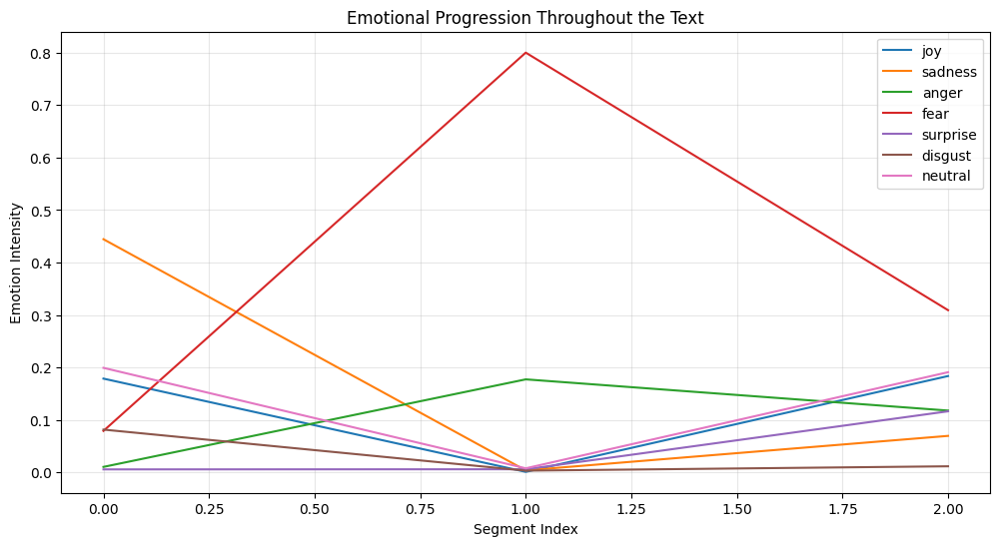


Generating music for each segment...
Generating music for prompt: A moderate fast melody in F# major, featuring guitar, with balanced articulation.
Duration: 10 seconds
Generated music for segment 1
Generating music for prompt: A moderate fast melody in F# major, featuring guitar, with balanced articulation.
Duration: 10 seconds
Generated music for segment 2
Generating music for prompt: A moderate fast melody in F# major, featuring guitar, with balanced articulation.
Duration: 10 seconds
Generated music for segment 3


In [ ]:
# Literary Text to Music Converter
# A system that extracts emotions from literary text and generates matching music

# Install required packages
!pip install torch torchtext nltk transformers pandas matplotlib scikit-learn librosa pydub

# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import nltk
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sklearn.preprocessing import MinMaxScaler
import json
import os
from google.colab import files

# Download NLTK resources properly
# This ensures the data is downloaded correctly in Colab
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
# Make sure the above downloads complete before proceeding
try:
    word_tokenize("Testing NLTK")
    print("NLTK resources downloaded successfully!")
except LookupError:
    print("Downloading additional NLTK resources...")
    # Alternative download method
    !python -m nltk.downloader punkt
    !python -m nltk.downloader stopwords
    !python -m nltk.downloader wordnet

class TextProcessor:
    def __init__(self):
        # Make sure stopwords are available
        try:
            self.stop_words = set(stopwords.words('english'))
        except LookupError:
            nltk.download('stopwords')
            self.stop_words = set(stopwords.words('english'))

        # Make sure wordnet is available
        try:
            self.lemmatizer = WordNetLemmatizer()
        except LookupError:
            nltk.download('wordnet')
            self.lemmatizer = WordNetLemmatizer()

    def clean_text(self, text):
        """Remove punctuation, lowercase, remove stopwords, and lemmatize"""
        # Lowercase the text
        text = text.lower()
        # Remove punctuation
        text = re.sub(r'[^\w\s]', '', text)

        # Try to tokenize, with fallback method if it fails
        try:
            # Tokenize into words
            words = word_tokenize(text)
        except LookupError:
            # Fallback: simple space-based tokenization
            words = text.split()

        # Remove stopwords and lemmatize
        cleaned_words = [self.lemmatizer.lemmatize(word) for word in words if word not in self.stop_words]
        return ' '.join(cleaned_words)

    def segment_text(self, text, segment_size=500):
        """Split text into segments of roughly equal size"""
        try:
            sentences = sent_tokenize(text)
        except LookupError:
            # Fallback: simple period-based sentence splitting
            sentences = [s.strip() + '.' for s in text.split('.') if s.strip()]

        segments = []
        current_segment = []
        current_length = 0

        for sentence in sentences:
            sentence_length = len(sentence)
            if current_length + sentence_length > segment_size and current_segment:
                segments.append(' '.join(current_segment))
                current_segment = [sentence]
                current_length = sentence_length
            else:
                current_segment.append(sentence)
                current_length += sentence_length

        # Add the last segment if it exists
        if current_segment:
            segments.append(' '.join(current_segment))

        return segments

    def process_text(self, text, segment_size=500):
        """Process the full text: segment first, then clean each segment"""
        segments = self.segment_text(text, segment_size)
        cleaned_segments = [self.clean_text(segment) for segment in segments]
        # Also keep the original segments for display purposes
        return segments, cleaned_segments

class EmotionExtractor:
    def __init__(self):
        # Load pre-trained emotion classification model
        try:
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                return_all_scores=True
            )
        except:
            # Handle the warning about return_all_scores being deprecated
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                top_k=None  # Using top_k=None instead of return_all_scores=True
            )

        # Define our emotion categories
        self.emotion_categories = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']

    def extract_emotions(self, text_segments):
        """Extract emotions from text segments"""
        emotion_maps = []

        for segment in text_segments:
            # Get emotion scores for the segment
            emotion_scores = self.emotion_classifier(segment)[0]

            # Convert to dictionary with emotion as key and score as value
            emotion_dict = {item['label']: item['score'] for item in emotion_scores}

            # Map the model's emotions to our simplified set if needed
            mapped_emotions = {
                'joy': emotion_dict.get('joy', 0),
                'sadness': emotion_dict.get('sadness', 0),
                'anger': emotion_dict.get('anger', 0),
                'fear': emotion_dict.get('fear', 0),
                'surprise': emotion_dict.get('surprise', 0),
                'disgust': emotion_dict.get('disgust', 0),
                'neutral': emotion_dict.get('neutral', 0)
            }

            emotion_maps.append(mapped_emotions)

        return emotion_maps

    def create_emotional_progression(self, emotion_maps):
        """Create a time series of emotions for the entire text"""
        progression = {emotion: [] for emotion in self.emotion_categories}

        for emotion_map in emotion_maps:
            for emotion in self.emotion_categories:
                progression[emotion].append(emotion_map[emotion])

        return progression

    def get_dominant_emotions(self, emotion_maps, top_n=2):
        """Get the dominant emotions for each segment"""
        dominant_emotions = []

        for emotion_map in emotion_maps:
            # Sort emotions by score
            sorted_emotions = sorted(emotion_map.items(), key=lambda x: x[1], reverse=True)
            # Take top n emotions
            top_emotions = sorted_emotions[:top_n]
            dominant_emotions.append(top_emotions)

        return dominant_emotions

class EmotionToMusicMapper(nn.Module):
    def __init__(self, input_dim=7, hidden_dim=64, output_dim=10):
        super(EmotionToMusicMapper, self).__init__()

        # Neural network for mapping emotions to musical features
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()  # Normalized output
        )

        # Define music feature mappings
        self.musical_features = {
            'tempo': {'min': 60, 'max': 180},     # BPM
            'key': {'min': 0, 'max': 11},         # C=0, C#=1, ..., B=11
            'mode': {'min': 0, 'max': 1},         # Minor=0, Major=1
            'intensity': {'min': 0, 'max': 1},    # Soft to loud
            'instrumentation': {'min': 0, 'max': 5},  # Different instrument groups
            'rhythm_complexity': {'min': 0, 'max': 1},
            'harmonic_complexity': {'min': 0, 'max': 1},
            'melodic_range': {'min': 0, 'max': 1},
            'texture': {'min': 0, 'max': 1},      # Sparse to dense
            'articulation': {'min': 0, 'max': 1}  # Staccato to legato
        }

        # Map features to index in output
        self.feature_to_idx = {feature: i for i, feature in enumerate(self.musical_features.keys())}

        # Define emotional correlations (simplified)
        self.emotion_correlations = {
            'joy': {'tempo': 'high', 'mode': 'major', 'intensity': 'moderate-high'},
            'sadness': {'tempo': 'low', 'mode': 'minor', 'intensity': 'low'},
            'anger': {'tempo': 'high', 'mode': 'minor', 'intensity': 'high'},
            'fear': {'tempo': 'variable', 'mode': 'minor', 'intensity': 'variable'},
            'surprise': {'tempo': 'variable', 'mode': 'variable', 'intensity': 'variable'},
            'disgust': {'tempo': 'low-moderate', 'mode': 'minor', 'intensity': 'moderate'},
            'neutral': {'tempo': 'moderate', 'mode': 'variable', 'intensity': 'moderate'}
        }

    def forward(self, emotion_vector):
        """Map emotion vector to musical features"""
        return self.network(emotion_vector)

    def map_to_actual_values(self, normalized_features):
        """Convert normalized outputs to actual musical values"""
        actual_values = {}

        for feature, feature_range in self.musical_features.items():
            idx = self.feature_to_idx[feature]
            norm_value = normalized_features[idx].item()

            # Scale to the actual range
            min_val = feature_range['min']
            max_val = feature_range['max']
            actual_value = min_val + norm_value * (max_val - min_val)

            # Round as needed
            if feature in ['key', 'instrumentation']:
                actual_value = round(actual_value)

            actual_values[feature] = actual_value

        return actual_values

    def generate_musiclm_prompt(self, musical_features):
        """Convert musical features to a MusicLM text prompt"""
        # Map key number to name
        key_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
        key_name = key_names[round(musical_features['key'])]

        # Map mode number to name
        mode_name = "major" if musical_features['mode'] > 0.5 else "minor"

        # Map instrumentation to instrument types
        instrument_types = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion']
        instrument = instrument_types[round(musical_features['instrumentation'])]

        # Determine tempo description
        tempo = musical_features['tempo']
        if tempo < 80:
            tempo_desc = "slow"
        elif tempo < 120:
            tempo_desc = "moderate"
        else:
            tempo_desc = "fast"

        # Determine intensity description
        intensity = musical_features['intensity']
        if intensity < 0.3:
            intensity_desc = "soft"
        elif intensity < 0.7:
            intensity_desc = "moderate"
        else:
            intensity_desc = "powerful"

        # Build the prompt
        prompt = f"A {intensity_desc} {tempo_desc} melody in {key_name} {mode_name}, "

        # Add texture
        texture = musical_features['texture']
        if texture < 0.3:
            prompt += "with a sparse arrangement, "
        elif texture > 0.7:
            prompt += "with a dense, layered arrangement, "

        # Add instrumentation
        prompt += f"featuring {instrument}, "

        # Add complexity
        rhythm_complexity = musical_features['rhythm_complexity']
        harmonic_complexity = musical_features['harmonic_complexity']

        if rhythm_complexity > 0.7 and harmonic_complexity > 0.7:
            prompt += "with complex rhythms and harmonies, "
        elif rhythm_complexity > 0.7:
            prompt += "with complex rhythms, "
        elif harmonic_complexity > 0.7:
            prompt += "with rich harmonies, "
        elif rhythm_complexity < 0.3 and harmonic_complexity < 0.3:
            prompt += "with simple, straightforward patterns, "

        # Add articulation
        articulation = musical_features['articulation']
        if articulation < 0.3:
            prompt += "played with staccato articulation."
        elif articulation > 0.7:
            prompt += "played with smooth, legato phrasing."
        else:
            prompt += "with balanced articulation."

        return prompt

class TemporalCoherenceModel(nn.Module):
    def __init__(self, input_dim=10, hidden_dim=64, output_dim=10):
        super(TemporalCoherenceModel, self).__init__()

        # LSTM for sequence modeling
        self.lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=2,
            batch_first=True,
            dropout=0.3
        )

        # Output layer
        self.output_layer = nn.Sequential(
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, sequence):
        """Process a sequence of musical features to ensure temporal coherence"""
        # Expected shape: [batch_size, sequence_length, features]
        lstm_out, _ = self.lstm(sequence)

        # Apply output layer to each time step
        coherent_sequence = self.output_layer(lstm_out)

        return coherent_sequence

class LiteraryMusicGenerator:
    def __init__(self):
        self.text_processor = TextProcessor()
        self.emotion_extractor = EmotionExtractor()
        self.emotion_to_music_mapper = EmotionToMusicMapper()
        self.temporal_coherence_model = TemporalCoherenceModel()

        # Initialize with some pre-trained weights (in a real scenario)
        # self.load_pretrained_models()

    def load_pretrained_models(self):
        """Load pre-trained models if available"""
        try:
            self.emotion_to_music_mapper.load_state_dict(torch.load('emotion_to_music_mapper.pth'))
            self.temporal_coherence_model.load_state_dict(torch.load('temporal_coherence_model.pth'))
            print("Loaded pre-trained models successfully.")
        except:
            print("Pre-trained models not found. Using initialized models.")

    def process_literary_text(self, text):
        """Process literary text end-to-end"""
        # Step 1: Process text
        original_segments, cleaned_segments = self.text_processor.process_text(text)

        # Step 2: Extract emotions
        emotion_maps = self.emotion_extractor.extract_emotions(original_segments)
        emotional_progression = self.emotion_extractor.create_emotional_progression(emotion_maps)
        dominant_emotions = self.emotion_extractor.get_dominant_emotions(emotion_maps)

        # Step 3: Generate musical features for each segment
        musical_features = []

        for emotion_map in emotion_maps:
            # Convert emotion map to tensor
            emotion_vector = torch.tensor([
                emotion_map['joy'], emotion_map['sadness'], emotion_map['anger'],
                emotion_map['fear'], emotion_map['surprise'], emotion_map['disgust'],
                emotion_map['neutral']
            ], dtype=torch.float32).unsqueeze(0)  # Add batch dimension

            # Map emotions to musical features
            with torch.no_grad():
                features = self.emotion_to_music_mapper(emotion_vector)

            musical_features.append(features.squeeze(0))

        # Step 4: Ensure temporal coherence
        if len(musical_features) > 1:
            # Stack features into a sequence
            feature_sequence = torch.stack(musical_features).unsqueeze(0)  # [1, seq_len, features]

            # Apply temporal coherence model
            with torch.no_grad():
                coherent_features = self.temporal_coherence_model(feature_sequence)

            # Convert back to list
            musical_features = [feat for feat in coherent_features.squeeze(0)]

        # Step 5: Generate MusicLM prompts
        musiclm_prompts = []

        for i, features in enumerate(musical_features):
            # Map normalized features to actual values
            actual_values = self.emotion_to_music_mapper.map_to_actual_values(features)

            # Generate prompt
            prompt = self.emotion_to_music_mapper.generate_musiclm_prompt(actual_values)

            # Add context from the text segment
            segment_context = f"Music representing: '{original_segments[i][:100]}...'"

            musiclm_prompts.append({
                "segment_idx": i,
                "prompt": prompt,
                "context": segment_context,
                "dominant_emotions": [{"emotion": e[0], "intensity": e[1]} for e in dominant_emotions[i]],
                "musical_features": actual_values
            })

        return {
            "segments": original_segments,
            "emotion_progression": emotional_progression,
            "musiclm_prompts": musiclm_prompts
        }

    def visualize_emotional_progression(self, emotional_progression):
        """Visualize the emotional progression throughout the text"""
        plt.figure(figsize=(12, 6))

        for emotion, values in emotional_progression.items():
            plt.plot(values, label=emotion)

        plt.xlabel('Segment Index')
        plt.ylabel('Emotion Intensity')
        plt.title('Emotional Progression Throughout the Text')
        plt.legend()
        plt.grid(True, alpha=0.3)
        return plt

    def train_models(self, training_data):
        """Train the emotion-to-music mapper and temporal coherence models"""
        # In a real implementation, this would use actual training data
        # This is a simplified placeholder
        pass

# Optional MusicLM API Connection (simulated for this example)
class MusicLMConnector:
    def __init__(self):
        # This would be an actual API key in a real implementation
        self.api_key = "simulated_api_key"

    def generate_music(self, prompt, duration_seconds=10):
        """Simulate generating music from MusicLM"""
        # In a real implementation, this would make an API call to MusicLM
        print(f"Generating music for prompt: {prompt}")
        print(f"Duration: {duration_seconds} seconds")

        # Simulate API response
        return {
            "status": "success",
            "prompt": prompt,
            "duration": duration_seconds,
            "audio_url": "simulated_audio_url.mp3"
        }

# Example usage and demonstration

def demo():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()
    musiclm_connector = MusicLMConnector()

    # Example literary text (a short excerpt)
    example_text = """
    The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead. Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage. It had been too long since she felt this sense of peace.

    Suddenly, dark clouds appeared on the horizon, rolling in with unexpected speed. The wind picked up, carrying with it the scent of rain and an undercurrent of foreboding. Sarah's smile faded as she watched the storm approach, her heart racing with a nameless anxiety.

    Lightning flashed, followed by a deafening crack of thunder that seemed to shake the very earth. Sarah ran back inside, slamming the door just as the rain began to pound against the windows like an angry fist demanding entry. She pressed her back against the door, breathing heavily, fighting the irrational fear that had gripped her.

    As quickly as it had arrived, the storm began to subside. The violent raindrops slowed to a gentle patter, and the thunder rumbled away into the distance. A ray of sunlight broke through the clouds, casting a golden glow over the rain-soaked landscape. Sarah felt her tension melting away, replaced by a profound sense of wonder at the resilience of nature and the beauty that can follow chaos.
    """

    # Process the text
    result = music_generator.process_literary_text(example_text)

    # Display the results
    print("Text Processing Complete!")
    print(f"Text divided into {len(result['segments'])} segments")

    print("\nEmotional Progression:")
    for emotion, values in result['emotion_progression'].items():
        print(f"  {emotion}: {[round(v, 2) for v in values]}")

    print("\nMusicLM Prompts:")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        print(f"  Context: {prompt_data['context']}")
        print(f"  Dominant emotions: {prompt_data['dominant_emotions']}")
        print(f"  MusicLM prompt: {prompt_data['prompt']}")

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    # Generate music for each segment (simulated)
    print("\nGenerating music for each segment...")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        music_result = musiclm_connector.generate_music(prompt_data['prompt'])
        print(f"Generated music for segment {i+1}")

# Mock training data generator
def generate_mock_training_data(num_samples=100):
    """Generate synthetic data for training the models"""
    emotions = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']
    musical_features = ['tempo', 'key', 'mode', 'intensity', 'instrumentation',
                         'rhythm_complexity', 'harmonic_complexity', 'melodic_range', 'texture', 'articulation']

    # Generate random emotion vectors
    emotion_vectors = np.random.rand(num_samples, len(emotions))
    # Normalize to sum to 1
    emotion_vectors = emotion_vectors / emotion_vectors.sum(axis=1, keepdims=True)

    # Generate matching musical features
    musical_feature_vectors = np.random.rand(num_samples, len(musical_features))

    # Create training dataset
    X_train = torch.tensor(emotion_vectors, dtype=torch.float32)
    y_train = torch.tensor(musical_feature_vectors, dtype=torch.float32)

    return X_train, y_train

# Training function for the emotion-to-music mapper
def train_emotion_to_music_mapper(model, num_epochs=100, batch_size=16):
    """Train the emotion-to-music mapping model"""
    # Generate mock training data
    X_train, y_train = generate_mock_training_data(500)

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Training function for the temporal coherence model
def train_temporal_coherence_model(model, seq_length=5, num_epochs=100, batch_size=8):
    """Train the temporal coherence model"""
    # For simplicity, we'll generate sequences of musical features
    num_samples = 100
    feature_dim = 10

    # Generate sequences with some temporal patterns
    sequences = []
    for _ in range(num_samples):
        # Start with random features
        start_features = np.random.rand(feature_dim)
        # Generate a sequence with gradual changes
        sequence = [start_features]
        for i in range(1, seq_length):
            # Each step is a small random modification of the previous step
            next_features = sequence[i-1] + np.random.normal(0, 0.1, feature_dim)
            # Keep within bounds
            next_features = np.clip(next_features, 0, 1)
            sequence.append(next_features)
        sequences.append(sequence)

    # Convert to torch tensors
    X_train = torch.tensor(np.array(sequences), dtype=torch.float32)
    # Target is the same sequence (we want to learn the patterns)
    y_train = X_train.clone()

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Main function to run everything
def main():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()

    # Train models
    print("Training emotion-to-music mapper...")
    train_emotion_to_music_mapper(music_generator.emotion_to_music_mapper, num_epochs=50)

    print("\nTraining temporal coherence model...")
    train_temporal_coherence_model(music_generator.temporal_coherence_model, num_epochs=50)

    # Run demo
    print("\nRunning demonstration...")
    demo()

    # Save models
    torch.save(music_generator.emotion_to_music_mapper.state_dict(), 'emotion_to_music_mapper.pth')
    torch.save(music_generator.temporal_coherence_model.state_dict(), 'temporal_coherence_model.pth')
    print("\nModels saved successfully!")

# Function to take user input and process it
def process_user_text():
    print("Please enter or paste your literary text (type 'END' on a new line when finished):")
    lines = []
    while True:
        line = input()
        if line.strip() == 'END':
            break
        lines.append(line)

    user_text = '\n'.join(lines)

    if not user_text.strip():
        print("No text entered. Using example text instead.")
        user_text = """
        The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead.
        Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage.
        As she walked along the path, her mind wandered to thoughts of the past, memories both sweet and bitter.
        """

    # Process the text
    music_generator = LiteraryMusicGenerator()
    result = music_generator.process_literary_text(user_text)

    # Display results
    print(f"\nProcessed {len(result['segments'])} text segments")

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    # Display MusicLM prompts
    print("\nGenerated MusicLM prompts:")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        print(f"  Dominant emotions: {[f'{e[0]} ({e[1]:.2f})' for e in prompt_data['dominant_emotions']]}")
        print(f"  MusicLM prompt: {prompt_data['prompt']}")

    # Save results to JSON
    output_data = {
        "segments": result['segments'],
        "emotion_progression": {k: [float(v) for v in vals] for k, vals in result['emotion_progression'].items()},
        "musiclm_prompts": result['musiclm_prompts']
    }

    with open('literary_music_results.json', 'w') as f:
        json.dump(output_data, f, indent=2)

    print("\nResults saved to 'literary_music_results.json'")
    try:
        files.download('literary_music_results.json')
        print("File download initiated.")
    except:
        print("File download not supported in this environment.")

# Interface for Google Colab
def colab_interface():
    print("Literary Text to Music Converter")
    print("================================")
    print("1. Run demonstration with example text")
    print("2. Process your own literary text")
    print("3. Train models")
    print("4. Exit")

    choice = input("\nEnter your choice (1-4): ")

    if choice == '1':
        demo()
    elif choice == '2':
        process_user_text()
    elif choice == '3':
        main()
    elif choice == '4':
        print("Exiting...")
    else:
        print("Invalid choice. Please try again.")

# Run the Colab interface
if __name__ == "__main__":
    colab_interface()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Literary Text to Music Converter
1. Run demonstration with example tex

Device set to use cuda:0



Processed 11 text segments


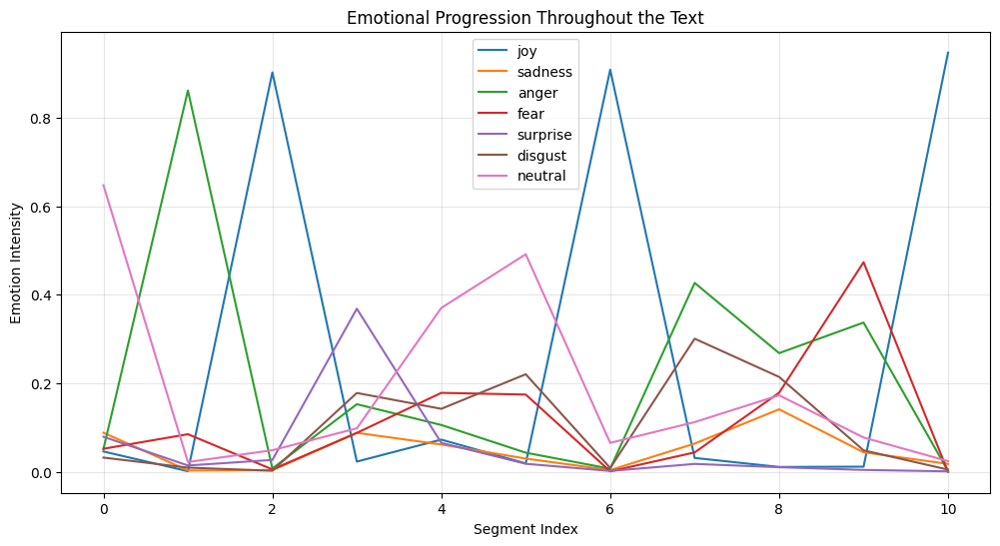


Playing music for each segment:

Segment 1:
  Dominant emotions: ['neutral (0.65)', 'sadness (0.09)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 2:
  Dominant emotions: ['anger (0.86)', 'fear (0.09)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 3:
  Dominant emotions: ['joy (0.90)', 'neutral (0.05)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 4:
  Dominant emotions: ['surprise (0.37)', 'disgust (0.18)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 5:
  Dominant emotions: ['neutral (0.37)', 'fear (0.18)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 6:
  Dominant emotions: ['neutral (0.49)', 'disgust (0.22)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 7:
  Dominant emotions: ['joy (0.91)', 'neutral (0.07)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 8:
  Dominant emotions: ['anger (0.43)', 'disgust (0.30)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 9:
  Dominant emotions: ['anger (0.27)', 'disgust (0.21)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 10:
  Dominant emotions: ['fear (0.47)', 'anger (0.34)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Segment 11:
  Dominant emotions: ['joy (0.95)', 'neutral (0.02)']
  MusicLM prompt: A moderate fast melody in F# major, featuring synth, with balanced articulation.



Would you like to save the MIDI files? (y/n): y


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved 11 MIDI files.
Would you like to combine all segments into one continuous piece? (y/n): y
Successfully combined music saved to combined_music.mid


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Combined music saved to combined_music.mid

Playing the combined music piece:



Results saved to 'literary_music_results.json'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Literary Text to Music Converter
# A system that extracts emotions from literary text and generates matching music

# Install required packages
!pip install torch torchtext nltk transformers pandas matplotlib scikit-learn librosa pydub midiutil pretty_midi

# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import nltk
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sklearn.preprocessing import MinMaxScaler
import json
import os
from google.colab import files
from midiutil import MIDIFile
import pretty_midi
import IPython.display as ipd
import random
import librosa
from pydub import AudioSegment
from pydub.playback import play
import io
import base64
import tempfile

# Download NLTK resources properly
# This ensures the data is downloaded correctly in Colab
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
# Make sure the above downloads complete before proceeding
try:
    word_tokenize("Testing NLTK")
    print("NLTK resources downloaded successfully!")
except LookupError:
    print("Downloading additional NLTK resources...")
    # Alternative download method
    !python -m nltk.downloader punkt
    !python -m nltk.downloader stopwords
    !python -m nltk.downloader wordnet

class TextProcessor:
    def __init__(self):
        # Make sure stopwords are available
        try:
            self.stop_words = set(stopwords.words('english'))
        except LookupError:
            nltk.download('stopwords')
            self.stop_words = set(stopwords.words('english'))

        # Make sure wordnet is available
        try:
            self.lemmatizer = WordNetLemmatizer()
        except LookupError:
            nltk.download('wordnet')
            self.lemmatizer = WordNetLemmatizer()

    def clean_text(self, text):
        """Remove punctuation, lowercase, remove stopwords, and lemmatize"""
        # Lowercase the text
        text = text.lower()
        # Remove punctuation
        text = re.sub(r'[^\w\s]', '', text)

        # Try to tokenize, with fallback method if it fails
        try:
            # Tokenize into words
            words = word_tokenize(text)
        except LookupError:
            # Fallback: simple space-based tokenization
            words = text.split()

        # Remove stopwords and lemmatize
        cleaned_words = [self.lemmatizer.lemmatize(word) for word in words if word not in self.stop_words]
        return ' '.join(cleaned_words)

    def segment_text(self, text, segment_size=500):
        """Split text into segments of roughly equal size"""
        try:
            sentences = sent_tokenize(text)
        except LookupError:
            # Fallback: simple period-based sentence splitting
            sentences = [s.strip() + '.' for s in text.split('.') if s.strip()]

        segments = []
        current_segment = []
        current_length = 0

        for sentence in sentences:
            sentence_length = len(sentence)
            if current_length + sentence_length > segment_size and current_segment:
                segments.append(' '.join(current_segment))
                current_segment = [sentence]
                current_length = sentence_length
            else:
                current_segment.append(sentence)
                current_length += sentence_length

        # Add the last segment if it exists
        if current_segment:
            segments.append(' '.join(current_segment))

        return segments

    def process_text(self, text, segment_size=500):
        """Process the full text: segment first, then clean each segment"""
        segments = self.segment_text(text, segment_size)
        cleaned_segments = [self.clean_text(segment) for segment in segments]
        # Also keep the original segments for display purposes
        return segments, cleaned_segments

class EmotionExtractor:
    def __init__(self):
        # Load pre-trained emotion classification model
        try:
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                return_all_scores=True
            )
        except:
            # Handle the warning about return_all_scores being deprecated
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                top_k=None  # Using top_k=None instead of return_all_scores=True
            )

        # Define our emotion categories
        self.emotion_categories = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']

    def extract_emotions(self, text_segments):
        """Extract emotions from text segments"""
        emotion_maps = []

        for segment in text_segments:
            # Get emotion scores for the segment
            emotion_scores = self.emotion_classifier(segment)[0]

            # Convert to dictionary with emotion as key and score as value
            emotion_dict = {item['label']: item['score'] for item in emotion_scores}

            # Map the model's emotions to our simplified set if needed
            mapped_emotions = {
                'joy': emotion_dict.get('joy', 0),
                'sadness': emotion_dict.get('sadness', 0),
                'anger': emotion_dict.get('anger', 0),
                'fear': emotion_dict.get('fear', 0),
                'surprise': emotion_dict.get('surprise', 0),
                'disgust': emotion_dict.get('disgust', 0),
                'neutral': emotion_dict.get('neutral', 0)
            }

            emotion_maps.append(mapped_emotions)

        return emotion_maps

    def create_emotional_progression(self, emotion_maps):
        """Create a time series of emotions for the entire text"""
        progression = {emotion: [] for emotion in self.emotion_categories}

        for emotion_map in emotion_maps:
            for emotion in self.emotion_categories:
                progression[emotion].append(emotion_map[emotion])

        return progression

    def get_dominant_emotions(self, emotion_maps, top_n=2):
        """Get the dominant emotions for each segment"""
        dominant_emotions = []

        for emotion_map in emotion_maps:
            # Sort emotions by score
            sorted_emotions = sorted(emotion_map.items(), key=lambda x: x[1], reverse=True)
            # Take top n emotions
            top_emotions = sorted_emotions[:top_n]
            dominant_emotions.append(top_emotions)

        return dominant_emotions

class EmotionToMusicMapper(nn.Module):
    def __init__(self, input_dim=7, hidden_dim=64, output_dim=10):
        super(EmotionToMusicMapper, self).__init__()

        # Neural network for mapping emotions to musical features
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()  # Normalized output
        )

        # Define music feature mappings
        self.musical_features = {
            'tempo': {'min': 60, 'max': 180},     # BPM
            'key': {'min': 0, 'max': 11},         # C=0, C#=1, ..., B=11
            'mode': {'min': 0, 'max': 1},         # Minor=0, Major=1
            'intensity': {'min': 0, 'max': 1},    # Soft to loud
            'instrumentation': {'min': 0, 'max': 5},  # Different instrument groups
            'rhythm_complexity': {'min': 0, 'max': 1},
            'harmonic_complexity': {'min': 0, 'max': 1},
            'melodic_range': {'min': 0, 'max': 1},
            'texture': {'min': 0, 'max': 1},      # Sparse to dense
            'articulation': {'min': 0, 'max': 1}  # Staccato to legato
        }

        # Map features to index in output
        self.feature_to_idx = {feature: i for i, feature in enumerate(self.musical_features.keys())}

        # Define emotional correlations (simplified)
        self.emotion_correlations = {
            'joy': {'tempo': 'high', 'mode': 'major', 'intensity': 'moderate-high'},
            'sadness': {'tempo': 'low', 'mode': 'minor', 'intensity': 'low'},
            'anger': {'tempo': 'high', 'mode': 'minor', 'intensity': 'high'},
            'fear': {'tempo': 'variable', 'mode': 'minor', 'intensity': 'variable'},
            'surprise': {'tempo': 'variable', 'mode': 'variable', 'intensity': 'variable'},
            'disgust': {'tempo': 'low-moderate', 'mode': 'minor', 'intensity': 'moderate'},
            'neutral': {'tempo': 'moderate', 'mode': 'variable', 'intensity': 'moderate'}
        }

    def forward(self, emotion_vector):
        """Map emotion vector to musical features"""
        return self.network(emotion_vector)

    def map_to_actual_values(self, normalized_features):
        """Convert normalized outputs to actual musical values"""
        actual_values = {}

        for feature, feature_range in self.musical_features.items():
            idx = self.feature_to_idx[feature]
            norm_value = normalized_features[idx].item()

            # Scale to the actual range
            min_val = feature_range['min']
            max_val = feature_range['max']
            actual_value = min_val + norm_value * (max_val - min_val)

            # Round as needed
            if feature in ['key', 'instrumentation']:
                actual_value = round(actual_value)

            actual_values[feature] = actual_value

        return actual_values

    def generate_musiclm_prompt(self, musical_features):
        """Convert musical features to a MusicLM text prompt"""
        # Map key number to name
        key_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
        key_name = key_names[round(musical_features['key'])]

        # Map mode number to name
        mode_name = "major" if musical_features['mode'] > 0.5 else "minor"

        # Map instrumentation to instrument types
        instrument_types = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion']
        instrument = instrument_types[round(musical_features['instrumentation'])]

        # Determine tempo description
        tempo = musical_features['tempo']
        if tempo < 80:
            tempo_desc = "slow"
        elif tempo < 120:
            tempo_desc = "moderate"
        else:
            tempo_desc = "fast"

        # Determine intensity description
        intensity = musical_features['intensity']
        if intensity < 0.3:
            intensity_desc = "soft"
        elif intensity < 0.7:
            intensity_desc = "moderate"
        else:
            intensity_desc = "powerful"

        # Build the prompt
        prompt = f"A {intensity_desc} {tempo_desc} melody in {key_name} {mode_name}, "

        # Add texture
        texture = musical_features['texture']
        if texture < 0.3:
            prompt += "with a sparse arrangement, "
        elif texture > 0.7:
            prompt += "with a dense, layered arrangement, "

        # Add instrumentation
        prompt += f"featuring {instrument}, "

        # Add complexity
        rhythm_complexity = musical_features['rhythm_complexity']
        harmonic_complexity = musical_features['harmonic_complexity']

        if rhythm_complexity > 0.7 and harmonic_complexity > 0.7:
            prompt += "with complex rhythms and harmonies, "
        elif rhythm_complexity > 0.7:
            prompt += "with complex rhythms, "
        elif harmonic_complexity > 0.7:
            prompt += "with rich harmonies, "
        elif rhythm_complexity < 0.3 and harmonic_complexity < 0.3:
            prompt += "with simple, straightforward patterns, "

        # Add articulation
        articulation = musical_features['articulation']
        if articulation < 0.3:
            prompt += "played with staccato articulation."
        elif articulation > 0.7:
            prompt += "played with smooth, legato phrasing."
        else:
            prompt += "with balanced articulation."

        return prompt

class TemporalCoherenceModel(nn.Module):
    def __init__(self, input_dim=10, hidden_dim=64, output_dim=10):
        super(TemporalCoherenceModel, self).__init__()

        # LSTM for sequence modeling
        self.lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=2,
            batch_first=True,
            dropout=0.3
        )

        # Output layer
        self.output_layer = nn.Sequential(
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, sequence):
        """Process a sequence of musical features to ensure temporal coherence"""
        # Expected shape: [batch_size, sequence_length, features]
        lstm_out, _ = self.lstm(sequence)

        # Apply output layer to each time step
        coherent_sequence = self.output_layer(lstm_out)

        return coherent_sequence

class MusicGenerator:
    def __init__(self):
        # MIDI settings
        self.instruments = {
            'piano': 0,       # Acoustic Grand Piano
            'strings': 48,    # String Ensemble 1
            'guitar': 24,     # Acoustic Guitar (nylon)
            'synth': 80,      # Lead 1 (square)
            'orchestral': 48, # String Ensemble 1
            'percussion': 118 # Synth Drum
        }

        # Scales (for different keys and modes)
        self.major_scale = [0, 2, 4, 5, 7, 9, 11]  # Whole, Whole, Half, Whole, Whole, Whole, Half
        self.minor_scale = [0, 2, 3, 5, 7, 8, 10]  # Whole, Half, Whole, Whole, Half, Whole, Whole

        # Common chord progressions
        self.progressions = {
            'major': [
                [1, 4, 5, 1],       # I-IV-V-I
                [1, 6, 4, 5],       # I-vi-IV-V
                [1, 5, 6, 4],       # I-V-vi-IV
                [2, 5, 1, 6]        # ii-V-I-vi
            ],
            'minor': [
                [1, 4, 5, 1],       # i-iv-v-i
                [1, 6, 3, 7],       # i-VI-III-VII
                [1, 7, 6, 5],       # i-VII-VI-v
                [1, 4, 7, 3]        # i-iv-VII-III
            ]
        }

    def create_midi_from_features(self, musical_features, duration_seconds=15):
        """Generate MIDI file from musical features"""
        # Extract features
        tempo = musical_features['tempo']
        key = int(musical_features['key'])
        mode = 'major' if musical_features['mode'] > 0.5 else 'minor'
        instrument_type = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion'][int(musical_features['instrumentation'])]
        instrument = self.instruments[instrument_type]

        # Derived parameters
        rhythm_complexity = musical_features['rhythm_complexity']
        harmonic_complexity = musical_features['harmonic_complexity']
        melodic_range = musical_features['melodic_range']
        intensity = musical_features['intensity']
        texture = musical_features['texture']
        articulation = musical_features['articulation']

        # Create MIDI file
        midi = MIDIFile(2)  # 2 tracks - one for melody, one for accompaniment
        track_melody = 0
        track_accomp = 1

        # Set tempo
        midi.addTempo(track_melody, 0, tempo)
        midi.addTempo(track_accomp, 0, tempo)

        # Choose scale based on mode
        scale = self.major_scale if mode == 'major' else self.minor_scale

        # Calculate beats based on tempo and duration
        total_beats = int((tempo / 60) * duration_seconds)

        # Set program (instrument)
        midi.addProgramChange(track_melody, 0, 0, instrument)
        midi.addProgramChange(track_accomp, 0, 0, instrument)

        # Choose chord progression based on mode and complexity
        prog_idx = min(int(harmonic_complexity * len(self.progressions[mode])), len(self.progressions[mode]) - 1)
        progression = self.progressions[mode][prog_idx]

        # Chord duration in beats
        chord_duration = max(4, total_beats // len(progression))
        repetitions = max(1, total_beats // (chord_duration * len(progression)))

        # Base octave for melody
        base_octave = 5 if instrument_type != 'piano' else 4

        # Calculate note range based on melodic range
        low_note = base_octave * 12  # C in the base octave
        high_note = low_note + int(12 + 12 * musical_features['melodic_range'])  # Up to an octave or two higher

        # Velocity (volume) based on intensity
        melody_velocity = 64 + int(intensity * 63)  # Between 64-127
        chord_velocity = int(melody_velocity * 0.8)  # Slightly quieter

        # Note duration modifier based on articulation (staccato to legato)
        duration_modifier = 0.5 + (articulation * 0.5)  # 0.5 (staccato) to 1.0 (legato)

        # Generate melody and chords
        current_beat = 0
        for rep in range(repetitions):
            for chord_idx, chord_root in enumerate(progression):
                # Map chord root to actual note in the key
                chord_root_idx = chord_root - 1  # Adjust for 0-indexing
                root_note = (key + scale[chord_root_idx]) % 12

                # Determine chord type based on position in scale
                is_major_chord = chord_root_idx in [0, 3, 4] if mode == 'major' else chord_root_idx in [2, 5]

                # Create chord notes (root, third, fifth)
                third_offset = 4 if is_major_chord else 3
                chord_notes = [
                    root_note + 60,  # Root note (C4 = 60, middle C)
                    root_note + 60 + third_offset,  # Third
                    root_note + 60 + 7   # Fifth
                ]

                # Add chord to accompaniment track with texture variation
                if texture < 0.3:
                    # Sparse - just root and fifth
                    midi.addNote(track_accomp, 0, chord_notes[0], current_beat, chord_duration * 0.9, chord_velocity)
                    midi.addNote(track_accomp, 0, chord_notes[2], current_beat, chord_duration * 0.9, chord_velocity)
                elif texture < 0.7:
                    # Medium - broken chord
                    for i, note in enumerate(chord_notes):
                        midi.addNote(track_accomp, 0, note, current_beat + i*0.5, chord_duration * 0.9 - i*0.5, chord_velocity)
                else:
                    # Dense - full chord plus extra notes
                    for note in chord_notes:
                        midi.addNote(track_accomp, 0, note, current_beat, chord_duration * 0.9, chord_velocity)
                    # Add extra notes for texture
                    midi.addNote(track_accomp, 0, chord_notes[0] + 12, current_beat + 1, chord_duration * 0.4, chord_velocity - 10)

                # Generate melody for this chord
                notes_per_beat = 1 + int(rhythm_complexity * 3)  # 1 to 4 notes per beat

                for beat_offset in range(chord_duration):
                    # Skip some beats randomly for variation
                    if random.random() < 0.2:
                        continue

                    for note_idx in range(notes_per_beat):
                        # Calculate precise timing
                        note_start = current_beat + beat_offset + (note_idx / notes_per_beat)

                        # Choose note from scale
                        scale_idx = random.randint(0, len(scale) - 1)
                        note = key + scale[scale_idx]

                        # Map to the right octave range
                        octave = random.randint(base_octave, base_octave + 1)
                        note = (note % 12) + (octave * 12)

                        # Ensure note is in our range
                        note = max(low_note, min(note, high_note))

                        # Calculate duration based on articulation and rhythm
                        note_duration = (1.0 / notes_per_beat) * duration_modifier

                        # Add note to melody track
                        if random.random() < 0.8:  # 80% chance to add a note (for rests)
                            midi.addNote(track_melody, 0, note, note_start, note_duration, melody_velocity)

                current_beat += chord_duration

        # Write MIDI file to bytes buffer
        buffer = io.BytesIO()
        midi.writeFile(buffer)
        buffer.seek(0)

        return buffer

class LiteraryMusicGenerator:
    def __init__(self):
        self.text_processor = TextProcessor()
        self.emotion_extractor = EmotionExtractor()
        self.emotion_to_music_mapper = EmotionToMusicMapper()
        self.temporal_coherence_model = TemporalCoherenceModel()
        self.music_generator = MusicGenerator()

        # Initialize with some pre-trained weights (in a real scenario)
        # self.load_pretrained_models()

    def load_pretrained_models(self):
        """Load pre-trained models if available"""
        try:
            self.emotion_to_music_mapper.load_state_dict(torch.load('emotion_to_music_mapper.pth'))
            self.temporal_coherence_model.load_state_dict(torch.load('temporal_coherence_model.pth'))
            print("Loaded pre-trained models successfully.")
        except:
            print("Pre-trained models not found. Using initialized models.")

    def process_literary_text(self, text):
        """Process literary text end-to-end"""
        # Step 1: Process text
        original_segments, cleaned_segments = self.text_processor.process_text(text)

        # Step 2: Extract emotions
        emotion_maps = self.emotion_extractor.extract_emotions(original_segments)
        emotional_progression = self.emotion_extractor.create_emotional_progression(emotion_maps)
        dominant_emotions = self.emotion_extractor.get_dominant_emotions(emotion_maps)

        # Step 3: Generate musical features for each segment
        musical_features = []

        for emotion_map in emotion_maps:
            # Convert emotion map to tensor
            emotion_vector = torch.tensor([
                emotion_map['joy'], emotion_map['sadness'], emotion_map['anger'],
                emotion_map['fear'], emotion_map['surprise'], emotion_map['disgust'],
                emotion_map['neutral']
            ], dtype=torch.float32).unsqueeze(0)  # Add batch dimension

            # Map emotions to musical features
            with torch.no_grad():
                features = self.emotion_to_music_mapper(emotion_vector)

            musical_features.append(features.squeeze(0))

        # Step 4: Ensure temporal coherence
        if len(musical_features) > 1:
            # Stack features into a sequence
            feature_sequence = torch.stack(musical_features).unsqueeze(0)  # [1, seq_len, features]

            # Apply temporal coherence model
            with torch.no_grad():
                coherent_features = self.temporal_coherence_model(feature_sequence)

            # Convert back to list
            musical_features = [feat for feat in coherent_features.squeeze(0)]

        # Step 5: Generate MusicLM prompts and MIDI files
        musiclm_prompts = []
        midi_files = []

        for i, features in enumerate(musical_features):
            # Map normalized features to actual values
            actual_values = self.emotion_to_music_mapper.map_to_actual_values(features)

            # Generate prompt
            prompt = self.emotion_to_music_mapper.generate_musiclm_prompt(actual_values)

            # Generate MIDI file
            midi_buffer = self.music_generator.create_midi_from_features(actual_values)
            midi_files.append(midi_buffer)

            # Add context from the text segment
            segment_context = f"Music representing: '{original_segments[i][:100]}...'"

            musiclm_prompts.append({
                "segment_idx": i,
                "prompt": prompt,
                "context": segment_context,
                "dominant_emotions": [{"emotion": e[0], "intensity": e[1]} for e in dominant_emotions[i]],
                "musical_features": actual_values
            })

        return {
            "segments": original_segments,
            "emotion_progression": emotional_progression,
            "musiclm_prompts": musiclm_prompts,
            "midi_files": midi_files
        }

    def visualize_emotional_progression(self, emotional_progression):
        """Visualize the emotional progression throughout the text"""
        plt.figure(figsize=(12, 6))

        for emotion, values in emotional_progression.items():
            plt.plot(values, label=emotion)

        plt.xlabel('Segment Index')
        plt.ylabel('Emotion Intensity')
        plt.title('Emotional Progression Throughout the Text')
        plt.legend()
        plt.grid(True, alpha=0.3)
        return plt

    def train_models(self, training_data):
        """Train the emotion-to-music mapper and temporal coherence models"""
        # In a real implementation, this would use actual training data
        # This is a simplified placeholder
        pass

# Helper functions for audio playback in Colab
def midi_to_audio(midi_buffer, sr=22050):
    """Convert MIDI to audio using pretty_midi"""
    # Create a temporary file to save the MIDI
    with tempfile.NamedTemporaryFile(suffix=".mid", delete=False) as temp_file:
        temp_file.write(midi_buffer.getvalue())
        temp_file_path = temp_file.name

    # Load the MIDI file
    midi_data = pretty_midi.PrettyMIDI(temp_file_path)

    # Synthesize audio
    audio = midi_data.synthesize(fs=sr)

    # Remove the temporary file
    os.remove(temp_file_path)

    return audio, sr

def play_midi_in_colab(midi_buffer):
    """Play MIDI in Colab notebook"""
    # Convert MIDI to audio
    audio, sr = midi_to_audio(midi_buffer)

    # Display audio player
    return ipd.Audio(audio, rate=sr)

def play_all_segments(midi_files):
    """Play all music segments sequentially"""
    for i, midi_buffer in enumerate(midi_files):
        print(f"Playing music for segment {i+1}...")
        display(play_midi_in_colab(midi_buffer))

# Example usage and demonstration
def demo():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()

    # Example literary text (a short excerpt)
    example_text = """
    The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead. Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage. It had been too long since she felt this sense of peace.

    Suddenly, dark clouds appeared on the horizon, rolling in with unexpected speed. The wind picked up, carrying with it the scent of rain and an undercurrent of foreboding. Sarah's smile faded as she watched the storm approach, her heart racing with a nameless anxiety.

    Lightning flashed, followed by a deafening crack of thunder that seemed to shake the very earth. Sarah ran back inside, slamming the door just as the rain began to pound against the windows like an angry fist demanding entry. She pressed her back against the door, breathing heavily, fighting the irrational fear that had gripped her.

    As quickly as it had arrived, the storm began to subside. The violent raindrops slowed to a gentle patter, and the thunder rumbled away into the distance. A ray of sunlight broke through the clouds, casting a golden glow over the rain-soaked landscape. Sarah felt her tension melting away, replaced by a profound sense of wonder at the resilience of nature and the beauty that can follow chaos.
    """

    # Process the text
    # Process the text
    result = music_generator.process_literary_text(example_text)

    # Display the results
    print("Text Processing Complete!")
    print(f"Text divided into {len(result['segments'])} segments")

    print("\nEmotional Progression:")
    for emotion, values in result['emotion_progression'].items():
        print(f"  {emotion}: {[round(v, 2) for v in values]}")

    print("\nMusicLM Prompts (now with actual music generation):")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        print(f"  Context: {prompt_data['context']}")
        print(f"  Dominant emotions: {prompt_data['dominant_emotions']}")
        print(f"  MusicLM prompt: {prompt_data['prompt']}")
        print(f"  Playing music for this segment...")
        display(play_midi_in_colab(result['midi_files'][i]))

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    print("\nAll music files generated successfully!")

# Mock training data generator
def generate_mock_training_data(num_samples=100):
    """Generate synthetic data for training the models"""
    emotions = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']
    musical_features = ['tempo', 'key', 'mode', 'intensity', 'instrumentation',
                         'rhythm_complexity', 'harmonic_complexity', 'melodic_range', 'texture', 'articulation']

    # Generate random emotion vectors
    emotion_vectors = np.random.rand(num_samples, len(emotions))
    # Normalize to sum to 1
    emotion_vectors = emotion_vectors / emotion_vectors.sum(axis=1, keepdims=True)

    # Generate matching musical features
    musical_feature_vectors = np.random.rand(num_samples, len(musical_features))

    # Create training dataset
    X_train = torch.tensor(emotion_vectors, dtype=torch.float32)
    y_train = torch.tensor(musical_feature_vectors, dtype=torch.float32)

    return X_train, y_train

# Training function for the emotion-to-music mapper
def train_emotion_to_music_mapper(model, num_epochs=100, batch_size=16):
    """Train the emotion-to-music mapping model"""
    # Generate mock training data
    X_train, y_train = generate_mock_training_data(500)

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Training function for the temporal coherence model
def train_temporal_coherence_model(model, seq_length=5, num_epochs=100, batch_size=8):
    """Train the temporal coherence model"""
    # For simplicity, we'll generate sequences of musical features
    num_samples = 100
    feature_dim = 10

    # Generate sequences with some temporal patterns
    sequences = []
    for _ in range(num_samples):
        # Start with random features
        start_features = np.random.rand(feature_dim)
        # Generate a sequence with gradual changes
        sequence = [start_features]
        for i in range(1, seq_length):
            # Each step is a small random modification of the previous step
            next_features = sequence[i-1] + np.random.normal(0, 0.1, feature_dim)
            # Keep within bounds
            next_features = np.clip(next_features, 0, 1)
            sequence.append(next_features)
        sequences.append(sequence)

    # Convert to torch tensors
    X_train = torch.tensor(np.array(sequences), dtype=torch.float32)
    # Target is the same sequence (we want to learn the patterns)
    y_train = X_train.clone()

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Main function to run everything
def main():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()

    # Train models
    print("Training emotion-to-music mapper...")
    train_emotion_to_music_mapper(music_generator.emotion_to_music_mapper, num_epochs=50)

    print("\nTraining temporal coherence model...")
    train_temporal_coherence_model(music_generator.temporal_coherence_model, num_epochs=50)

    # Run demo
    print("\nRunning demonstration...")
    demo()

    # Save models
    torch.save(music_generator.emotion_to_music_mapper.state_dict(), 'emotion_to_music_mapper.pth')
    torch.save(music_generator.temporal_coherence_model.state_dict(), 'temporal_coherence_model.pth')
    print("\nModels saved successfully!")

# Function to save MIDI files to disk
def save_midi_files(midi_files, base_filename="segment"):
    """Save MIDI files to disk and download them"""
    saved_files = []

    for i, midi_buffer in enumerate(midi_files):
        filename = f"{base_filename}_{i+1}.mid"

        # Write to file
        with open(filename, 'wb') as f:
            f.write(midi_buffer.getvalue())

        saved_files.append(filename)

        # Initiate download in Colab
        try:
            files.download(filename)
        except:
            print(f"Note: Download of {filename} may not be supported in this environment.")

    return saved_files

# Function to combine all segments into a single music piece
def combine_segments(midi_files, output_filename="combined_music.mid"):
    """Combine all MIDI segments into a single continuous piece"""
    # Create a new MIDI file with more tracks to prevent conflicts
    combined_midi = MIDIFile(8)  # Increase number of tracks to avoid note overlaps

    # Add tempo to all tracks
    for track in range(8):
        combined_midi.addTempo(track, 0, 120)

    current_time = 0
    track_offset = 0  # To distribute notes across different tracks

    for midi_buffer in midi_files:
        # Create a temporary file to save the MIDI
        with tempfile.NamedTemporaryFile(suffix=".mid", delete=False) as temp_file:
            temp_file.write(midi_buffer.getvalue())
            temp_file_path = temp_file.name

        try:
            # Load the MIDI file
            midi_data = pretty_midi.PrettyMIDI(temp_file_path)

            # Get segment duration
            end_time = 0
            if midi_data.instruments:
                for instr in midi_data.instruments:
                    if instr.notes:
                        instr_end = max([note.end for note in instr.notes])
                        end_time = max(end_time, instr_end)

            if end_time == 0:
                end_time = 15  # Default duration if no notes found

            # Add each note from the segment to the combined file with offset
            for instr_idx, instr in enumerate(midi_data.instruments):
                # Use a different track for each instrument to avoid conflicts
                track = (track_offset + instr_idx) % 8
                program = instr.program

                # Set instrument
                combined_midi.addProgramChange(track, 0, current_time, program)

                # Add notes with time offset
                for note in instr.notes:
                    start = current_time + note.start
                    duration = note.end - note.start

                    # Ensure notes have valid duration
                    if duration <= 0:
                        duration = 0.1  # Set a minimum duration

                    pitch = note.pitch
                    velocity = note.velocity

                    combined_midi.addNote(track, 0, pitch, start, duration, velocity)

            # Increment the track offset for the next segment to use different tracks
            track_offset = (track_offset + len(midi_data.instruments)) % 8

        except Exception as e:
            print(f"Warning: Error processing segment: {e}")
        finally:
            # Remove the temporary file
            try:
                os.remove(temp_file_path)
            except:
                pass

        # Update current time for next segment
        current_time += end_time + 2  # Add 2 beat gap between segments

    # Save the combined MIDI
    try:
        with open(output_filename, 'wb') as output_file:
            combined_midi.writeFile(output_file)

        print(f"Successfully combined music saved to {output_filename}")

        # Initiate download in Colab
        try:
            files.download(output_filename)
        except:
            print(f"Note: Download of {output_filename} may not be supported in this environment.")

        return output_filename
    except Exception as e:
        print(f"Error saving combined file: {e}")
        return None

# Function to take user input and process it
def process_user_text():
    print("Please enter or paste your literary text (type 'END' on a new line when finished):")
    lines = []
    while True:
        line = input()
        if line.strip() == 'END':
            break
        lines.append(line)

    user_text = '\n'.join(lines)

    if not user_text.strip():
        print("No text entered. Using example text instead.")
        user_text = """
        The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead.
        Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage.
        As she walked along the path, her mind wandered to thoughts of the past, memories both sweet and bitter.
        """

    # Process the text
    music_generator = LiteraryMusicGenerator()
    result = music_generator.process_literary_text(user_text)

    # Display results
    print(f"\nProcessed {len(result['segments'])} text segments")

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    # Play music for each segment
    print("\nPlaying music for each segment:")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        emotions_display = []
        for e in prompt_data['dominant_emotions']:
            emotions_display.append(f"{e['emotion']} ({e['intensity']:.2f})")
        print(f"  Dominant emotions: {emotions_display}")
        print(f"  MusicLM prompt: {prompt_data['prompt']}")

        # Play the music
        display(play_midi_in_colab(result['midi_files'][i]))

    # Option to save MIDI files
    save_choice = input("\nWould you like to save the MIDI files? (y/n): ")
    if save_choice.lower() == 'y':
        saved_files = save_midi_files(result['midi_files'])
        print(f"Saved {len(saved_files)} MIDI files.")

        # Option to combine segments
        combine_choice = input("Would you like to combine all segments into one continuous piece? (y/n): ")
        if combine_choice.lower() == 'y':
            combined_file = combine_segments(result['midi_files'])
            print(f"Combined music saved to {combined_file}")

            # Play the combined piece
            print("\nPlaying the combined music piece:")
            with open(combined_file, 'rb') as f:
                combined_buffer = io.BytesIO(f.read())
            display(play_midi_in_colab(combined_buffer))

    # Save results to JSON
    output_data = {
        "segments": result['segments'],
        "emotion_progression": {k: [float(v) for v in vals] for k, vals in result['emotion_progression'].items()},
        "musiclm_prompts": result['musiclm_prompts']
    }

    with open('literary_music_results.json', 'w') as f:
        json.dump(output_data, f, indent=2)

    print("\nResults saved to 'literary_music_results.json'")
    try:
        files.download('literary_music_results.json')
    except:
        print("File download not supported in this environment.")

# Interface for Google Colab
def colab_interface():
    print("Literary Text to Music Converter")
    print("================================")
    print("1. Run demonstration with example text")
    print("2. Process your own literary text")
    print("3. Train models")
    print("4. Exit")

    choice = input("\nEnter your choice (1-4): ")

    if choice == '1':
        demo()
    elif choice == '2':
        process_user_text()
    elif choice == '3':
        main()
    elif choice == '4':
        print("Exiting...")
    else:
        print("Invalid choice. Please try again.")

# Run the Colab interface
if __name__ == "__main__":
    colab_interface()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Literary Text to Music Converter
1. Run demonstration with example tex

Device set to use cuda:0


Training emotion-to-music mapper...
Epoch 10/50, Loss: 0.0847
Epoch 20/50, Loss: 0.0843
Epoch 30/50, Loss: 0.0839
Epoch 40/50, Loss: 0.0841
Epoch 50/50, Loss: 0.0838
Training complete!

Training temporal coherence model...
Epoch 10/50, Loss: 0.0553
Epoch 20/50, Loss: 0.0316
Epoch 30/50, Loss: 0.0218
Epoch 40/50, Loss: 0.0161
Epoch 50/50, Loss: 0.0134
Training complete!

Running demonstration...


Device set to use cuda:0


Text Processing Complete!
Text divided into 3 segments

Emotional Progression:
  joy: [0.18, 0.0, 0.18]
  sadness: [0.44, 0.0, 0.07]
  anger: [0.01, 0.18, 0.12]
  fear: [0.08, 0.8, 0.31]
  surprise: [0.01, 0.01, 0.12]
  disgust: [0.08, 0.0, 0.01]
  neutral: [0.2, 0.01, 0.19]

Overall Emotional Flow Narrative:
The emotional journey of this text flows through: sadness → fear.

A MusicLM composition capturing this emotional flow should: begin with a somber section, conclude with a mysterious finale.

Segment-by-Segment Music Prompts:

Segment 1:
  Context: Music representing: 'The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead...'
  Dominant emotions: [{'emotion': 'sadness', 'intensity': 0.4444315433502197}, {'emotion': 'neutral', 'intensity': 0.1993372142314911}]
  Enhanced MusicLM prompt: A melancholic and ambient piece in F# major, fast tempo, moderate in intensity, featuring synth and piano, with balanced articulation. The music convey


Segment 2:
  Context: Music representing: 'Sarah's smile faded as she watched the storm approach, her heart racing with a nameless anxiety. Lig...'
  Dominant emotions: [{'emotion': 'fear', 'intensity': 0.7999191880226135}, {'emotion': 'anger', 'intensity': 0.17740094661712646}]
  Enhanced MusicLM prompt: A unsettling and chaotic piece in F# major, fast tempo, moderate in intensity, featuring synth and orchestral, with balanced articulation. The music conveys a sense of fear.
  Playing music for this segment...



Segment 3:
  Context: Music representing: 'The violent raindrops slowed to a gentle patter, and the thunder rumbled away into the distance. A r...'
  Dominant emotions: [{'emotion': 'fear', 'intensity': 0.3092297315597534}, {'emotion': 'neutral', 'intensity': 0.19102820754051208}]
  Enhanced MusicLM prompt: A ambient and suspenseful piece in F# major, fast tempo, moderate in intensity, featuring synth and guitar, with balanced articulation. The music conveys a sense of fear.
  Playing music for this segment...



Transition Prompts Between Segments:

Transition 1: From Segment 1 to 2
  Prompt: A transition from sadness to fear that maintains musical coherence while evolving from contemplative to dissonant. Featuring synth throughout. 

Transition 2: From Segment 2 to 3
  Prompt: A gradual transition that maintains musical coherence while evolving from tense to unsettling. Featuring synth throughout. 


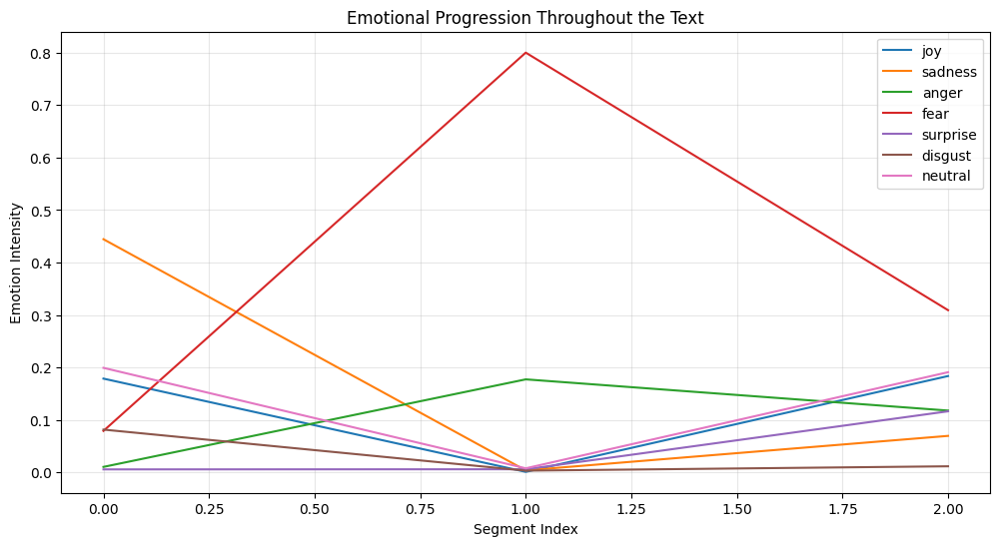


All music files generated successfully!

Models saved successfully!


In [ ]:
# Literary Text to Music Converter
# A system that extracts emotions from literary text and generates matching music

# Install required packages
!pip install torch torchtext nltk transformers pandas matplotlib scikit-learn librosa pydub midiutil pretty_midi

# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import nltk
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sklearn.preprocessing import MinMaxScaler
import json
import os
from google.colab import files
from midiutil import MIDIFile
import pretty_midi
import IPython.display as ipd
import random
import librosa
from pydub import AudioSegment
from pydub.playback import play
import io
import base64
import tempfile

# Download NLTK resources properly
# This ensures the data is downloaded correctly in Colab
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
# Make sure the above downloads complete before proceeding
try:
    word_tokenize("Testing NLTK")
    print("NLTK resources downloaded successfully!")
except LookupError:
    print("Downloading additional NLTK resources...")
    # Alternative download method
    !python -m nltk.downloader punkt
    !python -m nltk.downloader stopwords
    !python -m nltk.downloader wordnet

class TextProcessor:
    def __init__(self):
        # Make sure stopwords are available
        try:
            self.stop_words = set(stopwords.words('english'))
        except LookupError:
            nltk.download('stopwords')
            self.stop_words = set(stopwords.words('english'))

        # Make sure wordnet is available
        try:
            self.lemmatizer = WordNetLemmatizer()
        except LookupError:
            nltk.download('wordnet')
            self.lemmatizer = WordNetLemmatizer()

    def clean_text(self, text):
        """Remove punctuation, lowercase, remove stopwords, and lemmatize"""
        # Lowercase the text
        text = text.lower()
        # Remove punctuation
        text = re.sub(r'[^\w\s]', '', text)

        # Try to tokenize, with fallback method if it fails
        try:
            # Tokenize into words
            words = word_tokenize(text)
        except LookupError:
            # Fallback: simple space-based tokenization
            words = text.split()

        # Remove stopwords and lemmatize
        cleaned_words = [self.lemmatizer.lemmatize(word) for word in words if word not in self.stop_words]
        return ' '.join(cleaned_words)

    def segment_text(self, text, segment_size=500):
        """Split text into segments of roughly equal size"""
        try:
            sentences = sent_tokenize(text)
        except LookupError:
            # Fallback: simple period-based sentence splitting
            sentences = [s.strip() + '.' for s in text.split('.') if s.strip()]

        segments = []
        current_segment = []
        current_length = 0

        for sentence in sentences:
            sentence_length = len(sentence)
            if current_length + sentence_length > segment_size and current_segment:
                segments.append(' '.join(current_segment))
                current_segment = [sentence]
                current_length = sentence_length
            else:
                current_segment.append(sentence)
                current_length += sentence_length

        # Add the last segment if it exists
        if current_segment:
            segments.append(' '.join(current_segment))

        return segments

    def process_text(self, text, segment_size=500):
        """Process the full text: segment first, then clean each segment"""
        segments = self.segment_text(text, segment_size)
        cleaned_segments = [self.clean_text(segment) for segment in segments]
        # Also keep the original segments for display purposes
        return segments, cleaned_segments

class EmotionExtractor:
    def __init__(self):
        # Load pre-trained emotion classification model
        try:
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                return_all_scores=True
            )
        except:
            # Handle the warning about return_all_scores being deprecated
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                top_k=None  # Using top_k=None instead of return_all_scores=True
            )

        # Define our emotion categories
        self.emotion_categories = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']

    def extract_emotions(self, text_segments):
        """Extract emotions from text segments"""
        emotion_maps = []

        for segment in text_segments:
            # Get emotion scores for the segment
            emotion_scores = self.emotion_classifier(segment)[0]

            # Convert to dictionary with emotion as key and score as value
            emotion_dict = {item['label']: item['score'] for item in emotion_scores}

            # Map the model's emotions to our simplified set if needed
            mapped_emotions = {
                'joy': emotion_dict.get('joy', 0),
                'sadness': emotion_dict.get('sadness', 0),
                'anger': emotion_dict.get('anger', 0),
                'fear': emotion_dict.get('fear', 0),
                'surprise': emotion_dict.get('surprise', 0),
                'disgust': emotion_dict.get('disgust', 0),
                'neutral': emotion_dict.get('neutral', 0)
            }

            emotion_maps.append(mapped_emotions)

        return emotion_maps

    def create_emotional_progression(self, emotion_maps):
        """Create a time series of emotions for the entire text"""
        progression = {emotion: [] for emotion in self.emotion_categories}

        for emotion_map in emotion_maps:
            for emotion in self.emotion_categories:
                progression[emotion].append(emotion_map[emotion])

        return progression

    def get_dominant_emotions(self, emotion_maps, top_n=2):
        """Get the dominant emotions for each segment"""
        dominant_emotions = []

        for emotion_map in emotion_maps:
            # Sort emotions by score
            sorted_emotions = sorted(emotion_map.items(), key=lambda x: x[1], reverse=True)
            # Take top n emotions
            top_emotions = sorted_emotions[:top_n]
            dominant_emotions.append(top_emotions)

        return dominant_emotions

class EmotionToMusicMapper(nn.Module):
    def __init__(self, input_dim=7, hidden_dim=64, output_dim=10):
        super(EmotionToMusicMapper, self).__init__()

        # Neural network for mapping emotions to musical features
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()  # Normalized output
        )

        # Define music feature mappings
        self.musical_features = {
            'tempo': {'min': 60, 'max': 180},     # BPM
            'key': {'min': 0, 'max': 11},         # C=0, C#=1, ..., B=11
            'mode': {'min': 0, 'max': 1},         # Minor=0, Major=1
            'intensity': {'min': 0, 'max': 1},    # Soft to loud
            'instrumentation': {'min': 0, 'max': 5},  # Different instrument groups
            'rhythm_complexity': {'min': 0, 'max': 1},
            'harmonic_complexity': {'min': 0, 'max': 1},
            'melodic_range': {'min': 0, 'max': 1},
            'texture': {'min': 0, 'max': 1},      # Sparse to dense
            'articulation': {'min': 0, 'max': 1}  # Staccato to legato
        }

        # Map features to index in output
        self.feature_to_idx = {feature: i for i, feature in enumerate(self.musical_features.keys())}

        # Define emotional correlations (expanded with more nuanced mappings)
        self.emotion_correlations = {
            'joy': {
                'tempo': 'high',
                'mode': 'major',
                'intensity': 'moderate-high',
                'rhythm_complexity': 'moderate',
                'harmonic_complexity': 'moderate',
                'instrumentation': ['piano', 'strings', 'synth'],
                'description': ['uplifting', 'bright', 'cheerful', 'buoyant', 'exuberant', 'playful', 'optimistic']
            },
            'sadness': {
                'tempo': 'low',
                'mode': 'minor',
                'intensity': 'low',
                'rhythm_complexity': 'low',
                'harmonic_complexity': 'moderate-high',
                'instrumentation': ['piano', 'strings', 'guitar'],
                'description': ['melancholic', 'somber', 'wistful', 'contemplative', 'haunting', 'bittersweet', 'mournful']
            },
            'anger': {
                'tempo': 'high',
                'mode': 'minor',
                'intensity': 'high',
                'rhythm_complexity': 'high',
                'harmonic_complexity': 'high',
                'instrumentation': ['synth', 'percussion', 'orchestral'],
                'description': ['intense', 'aggressive', 'powerful', 'driving', 'dissonant', 'chaotic', 'turbulent']
            },
            'fear': {
                'tempo': 'variable',
                'mode': 'minor',
                'intensity': 'variable',
                'rhythm_complexity': 'low',
                'harmonic_complexity': 'high',
                'instrumentation': ['strings', 'synth', 'percussion'],
                'description': ['tense', 'suspenseful', 'eerie', 'unsettling', 'mysterious', 'foreboding', 'chilling']
            },
            'surprise': {
                'tempo': 'variable',
                'mode': 'variable',
                'intensity': 'variable',
                'rhythm_complexity': 'high',
                'harmonic_complexity': 'moderate',
                'instrumentation': ['piano', 'synth', 'orchestral'],
                'description': ['unexpected', 'quirky', 'sudden', 'playful', 'whimsical', 'unpredictable', 'startling']
            },
            'disgust': {
                'tempo': 'low-moderate',
                'mode': 'minor',
                'intensity': 'moderate',
                'rhythm_complexity': 'moderate',
                'harmonic_complexity': 'high',
                'instrumentation': ['synth', 'percussion', 'orchestral'],
                'description': ['dissonant', 'unsettling', 'gritty', 'uncomfortable', 'jarring', 'off-kilter', 'distorted']
            },
            'neutral': {
                'tempo': 'moderate',
                'mode': 'variable',
                'intensity': 'moderate',
                'rhythm_complexity': 'moderate',
                'harmonic_complexity': 'moderate',
                'instrumentation': ['piano', 'strings', 'guitar'],
                'description': ['balanced', 'ambient', 'atmospheric', 'calm', 'steady', 'peaceful', 'flowing']
            }
        }

    def forward(self, emotion_vector):
        """Map emotion vector to musical features"""
        return self.network(emotion_vector)

    def map_to_actual_values(self, normalized_features):
        """Convert normalized outputs to actual musical values"""
        actual_values = {}

        for feature, feature_range in self.musical_features.items():
            idx = self.feature_to_idx[feature]
            norm_value = normalized_features[idx].item()

            # Scale to the actual range
            min_val = feature_range['min']
            max_val = feature_range['max']
            actual_value = min_val + norm_value * (max_val - min_val)

            # Round as needed
            if feature in ['key', 'instrumentation']:
                actual_value = round(actual_value)

            actual_values[feature] = actual_value

        return actual_values

    def get_descriptors_for_emotion_blend(self, emotion_scores):
        """Get appropriate musical descriptors based on a blend of emotions"""
        # Get top 2 emotions
        sorted_emotions = sorted(emotion_scores.items(), key=lambda x: x[1], reverse=True)
        top_emotions = sorted_emotions[:2]

        descriptors = []
        instruments = set()

        # Weighted selection of descriptors based on emotion intensity
        total_weight = sum(score for _, score in top_emotions)

        for emotion, score in top_emotions:
            # Skip emotions with very low scores
            if score < 0.1:
                continue

            # Weight by the emotion's intensity
            weight = score / total_weight

            # Get descriptors for this emotion
            emotion_descriptors = self.emotion_correlations[emotion]['description']

            # Add descriptors proportional to the emotion's weight
            num_descriptors = max(1, int(weight * 3))  # At least 1, up to 3 descriptors
            selected_descriptors = random.sample(emotion_descriptors, min(num_descriptors, len(emotion_descriptors)))
            descriptors.extend(selected_descriptors)

            # Add potential instruments
            emotion_instruments = self.emotion_correlations[emotion]['instrumentation']
            # Choose 1-2 instruments based on weight
            num_instruments = max(1, int(weight * 2))
            selected_instruments = random.sample(emotion_instruments, min(num_instruments, len(emotion_instruments)))
            instruments.update(selected_instruments)

        # Return unique descriptors and instruments
        return list(set(descriptors)), list(instruments)

    def generate_musiclm_prompt(self, musical_features, emotion_scores=None):
        """Convert musical features to a MusicLM text prompt"""
        # Map key number to name
        key_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
        key_name = key_names[round(musical_features['key'])]

        # Map mode number to name
        mode_name = "major" if musical_features['mode'] > 0.5 else "minor"

        # Map instrumentation to instrument types
        instrument_types = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion']
        instrument = instrument_types[round(musical_features['instrumentation'])]

        # Determine tempo description
        tempo = musical_features['tempo']
        if tempo < 80:
            tempo_desc = "slow"
        elif tempo < 120:
            tempo_desc = "moderate"
        else:
            tempo_desc = "fast"

        # Determine intensity description
        intensity = musical_features['intensity']
        if intensity < 0.3:
            intensity_desc = "soft"
        elif intensity < 0.7:
            intensity_desc = "moderate"
        else:
            intensity_desc = "powerful"

        # Get emotional descriptors if emotion scores are provided
        if emotion_scores:
            emotional_descriptors, suggested_instruments = self.get_descriptors_for_emotion_blend(emotion_scores)

            # Use suggested instruments if available, otherwise use the mapped one
            if suggested_instruments:
                # Prioritize the instrument from musical features but include others
                all_instruments = [instrument] + [i for i in suggested_instruments if i != instrument]
                # Take up to 2 instruments
                instrument_phrase = " and ".join(all_instruments[:2])
            else:
                instrument_phrase = instrument

            # Build a more emotionally nuanced prompt
            prompt = f"A {' and '.join(emotional_descriptors[:2])} piece in {key_name} {mode_name}, "
            prompt += f"{tempo_desc} tempo, {intensity_desc} in intensity, "
            prompt += f"featuring {instrument_phrase}, "

        else:
            # Use the original approach as fallback
            # Build the prompt
            prompt = f"A {intensity_desc} {tempo_desc} melody in {key_name} {mode_name}, "

            # Add texture
            texture = musical_features['texture']
            if texture < 0.3:
                prompt += "with a sparse arrangement, "
            elif texture > 0.7:
                prompt += "with a dense, layered arrangement, "

            # Add instrumentation
            prompt += f"featuring {instrument}, "

        # Add complexity
        rhythm_complexity = musical_features['rhythm_complexity']
        harmonic_complexity = musical_features['harmonic_complexity']

        if rhythm_complexity > 0.7 and harmonic_complexity > 0.7:
            prompt += "with complex rhythms and harmonies, "
        elif rhythm_complexity > 0.7:
            prompt += "with complex rhythms, "
        elif harmonic_complexity > 0.7:
            prompt += "with rich harmonies, "
        elif rhythm_complexity < 0.3 and harmonic_complexity < 0.3:
            prompt += "with simple, straightforward patterns, "

        # Add articulation
        articulation = musical_features['articulation']
        if articulation < 0.3:
            prompt += "played with staccato articulation."
        elif articulation > 0.7:
            prompt += "played with smooth, legato phrasing."
        else:
            prompt += "with balanced articulation."

        # Add emotional context at the end for a more complete prompt
        if emotion_scores:
            top_emotion = max(emotion_scores.items(), key=lambda x: x[1])
            if top_emotion[1] > 0.3:  # Only if the emotion is significant
                prompt += f" The music conveys a sense of {top_emotion[0]}."

        return prompt

    def generate_transition_prompt(self, prev_features, current_features, prev_emotions, current_emotions):
        """Generate a prompt specifically for transitions between emotional states"""
        # Identify the most significant emotional shift
        prev_top_emotion = max(prev_emotions.items(), key=lambda x: x[1])
        current_top_emotion = max(current_emotions.items(), key=lambda x: x[1])

        # Check if there's a significant emotional shift
        if prev_top_emotion[0] != current_top_emotion[0] and prev_top_emotion[1] > 0.3 and current_top_emotion[1] > 0.3:
            transition_type = f"transition from {prev_top_emotion[0]} to {current_top_emotion[0]}"
        else:
            # If no major emotional shift, focus on musical parameter changes
            changes = []

            # Check tempo change
            prev_tempo = prev_features['tempo']
            current_tempo = current_features['tempo']
            if abs(prev_tempo - current_tempo) > 20:  # Significant tempo change
                direction = "accelerating" if current_tempo > prev_tempo else "decelerating"
                changes.append(direction)

            # Check intensity change
            prev_intensity = prev_features['intensity']
            current_intensity = current_features['intensity']
            if abs(prev_intensity - current_intensity) > 0.3:  # Significant intensity change
                direction = "building in intensity" if current_intensity > prev_intensity else "becoming more subdued"
                changes.append(direction)

            # Check mode change
            prev_mode = "major" if prev_features['mode'] > 0.5 else "minor"
            current_mode = "major" if current_features['mode'] > 0.5 else "minor"
            if prev_mode != current_mode:
                changes.append(f"shifting from {prev_mode} to {current_mode}")

            if changes:
                transition_type = ", ".join(changes)
            else:
                transition_type = "gradual transition"

        # Generate the transition prompt
        prompt = f"A {transition_type} that maintains musical coherence while "

        # Add emotional descriptors
        prev_descriptors, _ = self.get_descriptors_for_emotion_blend(prev_emotions)
        current_descriptors, _ = self.get_descriptors_for_emotion_blend(current_emotions)

        if prev_descriptors and current_descriptors:
            prompt += f"evolving from {prev_descriptors[0]} to {current_descriptors[0]}. "

        # Add instrumentation continuity
        instrument_types = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion']
        prev_instrument = instrument_types[round(prev_features['instrumentation'])]
        current_instrument = instrument_types[round(current_features['instrumentation'])]

        if prev_instrument == current_instrument:
            prompt += f"Featuring {prev_instrument} throughout. "
        else:
            prompt += f"Transitioning from {prev_instrument} to {current_instrument}. "

        return prompt

class TemporalCoherenceModel(nn.Module):
    def __init__(self, input_dim=10, hidden_dim=64, output_dim=10):
        super(TemporalCoherenceModel, self).__init__()

        # LSTM for sequence modeling
        self.lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=2,
            batch_first=True,
            dropout=0.3
        )

        # Output layer
        self.output_layer = nn.Sequential(
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, sequence):
        """Process a sequence of musical features to ensure temporal coherence"""
        # Expected shape: [batch_size, sequence_length, features]
        lstm_out, _ = self.lstm(sequence)

        # Apply output layer to each time step
        coherent_sequence = self.output_layer(lstm_out)

        return coherent_sequence

class MusicGenerator:
    def __init__(self):
        # MIDI settings
        self.instruments = {
            'piano': 0,       # Acoustic Grand Piano
            'strings': 48,    # String Ensemble 1
            'guitar': 24,     # Acoustic Guitar (nylon)
            'synth': 80,      # Lead 1 (square)
            'orchestral': 48, # String Ensemble 1
            'percussion': 118 # Synth Drum
        }

        # Scales (for different keys and modes)
        self.major_scale = [0, 2, 4, 5, 7, 9, 11]  # Whole, Whole, Half, Whole, Whole, Whole, Half
        self.minor_scale = [0, 2, 3, 5, 7, 8, 10]  # Whole, Half, Whole, Whole, Half, Whole, Whole

        # Common chord progressions
        self.progressions = {
            'major': [
                [1, 4, 5, 1],       # I-IV-V-I
                [1, 6, 4, 5],       # I-vi-IV-V
                [1, 5, 6, 4],       # I-V-vi-IV
                [2, 5, 1, 6]        # ii-V-I-vi
            ],
            'minor': [
                [1, 4, 5, 1],       # i-iv-v-i
                [1, 6, 3, 7],       # i-VI-III-VII
                [1, 7, 6, 5],       # i-VII-VI-v
                [1, 4, 7, 3]        # i-iv-VII-III
            ]
        }

    def create_midi_from_features(self, musical_features, duration_seconds=15):
        """Generate MIDI file from musical features"""
        # Extract features
        tempo = musical_features['tempo']
        key = int(musical_features['key'])
        mode = 'major' if musical_features['mode'] > 0.5 else 'minor'
        instrument_type = ['piano', 'strings', 'guitar', 'synth', 'orchestral', 'percussion'][int(musical_features['instrumentation'])]
        instrument = self.instruments[instrument_type]

        # Derived parameters
        rhythm_complexity = musical_features['rhythm_complexity']
        harmonic_complexity = musical_features['harmonic_complexity']
        melodic_range = musical_features['melodic_range']
        intensity = musical_features['intensity']
        texture = musical_features['texture']
        articulation = musical_features['articulation']

        # Create MIDI file
        midi = MIDIFile(2)  # 2 tracks - one for melody, one for accompaniment
        track_melody = 0
        track_accomp = 1

        # Set tempo
        midi.addTempo(track_melody, 0, tempo)
        midi.addTempo(track_accomp, 0, tempo)

        # Choose scale based on mode
        scale = self.major_scale if mode == 'major' else self.minor_scale

        # Calculate beats based on tempo and duration
        total_beats = int((tempo / 60) * duration_seconds)

        # Set program (instrument)
        midi.addProgramChange(track_melody, 0, 0, instrument)
        midi.addProgramChange(track_accomp, 0, 0, instrument)

        # Choose chord progression based on mode and complexity
        prog_idx = min(int(harmonic_complexity * len(self.progressions[mode])), len(self.progressions[mode]) - 1)
        progression = self.progressions[mode][prog_idx]

        # Chord duration in beats
        chord_duration = max(4, total_beats // len(progression))
        repetitions = max(1, total_beats // (chord_duration * len(progression)))

        # Base octave for melody
        base_octave = 5 if instrument_type != 'piano' else 4

        # Calculate note range based on melodic range
        low_note = base_octave * 12  # C in the base octave
        high_note = low_note + int(12 + 12 * musical_features['melodic_range'])  # Up to an octave or two higher

        # Velocity (volume) based on intensity
        melody_velocity = 64 + int(intensity * 63)  # Between 64-127
        chord_velocity = int(melody_velocity * 0.8)  # Slightly quieter

        # Note duration modifier based on articulation (staccato to legato)
        duration_modifier = 0.5 + (articulation * 0.5)  # 0.5 (staccato) to 1.0 (legato)

        # Generate melody and chords
        current_beat = 0
        for rep in range(repetitions):
            for chord_idx, chord_root in enumerate(progression):
                # Map chord root to actual note in the key
                chord_root_idx = chord_root - 1  # Adjust for 0-indexing
                root_note = (key + scale[chord_root_idx]) % 12

                # Determine chord type based on position in scale
                is_major_chord = chord_root_idx in [0, 3, 4] if mode == 'major' else chord_root_idx in [2, 5]

                # Create chord notes (root, third, fifth)
                third_offset = 4 if is_major_chord else 3
                chord_notes = [
                    root_note + 60,  # Root note (C4 = 60, middle C)
                    root_note + 60 + third_offset,  # Third
                    root_note + 60 + 7   # Fifth
                ]

                # Add chord to accompaniment track with texture variation
                if texture < 0.3:
                    # Sparse - just root and fifth
                    midi.addNote(track_accomp, 0, chord_notes[0], current_beat, chord_duration * 0.9, chord_velocity)
                    midi.addNote(track_accomp, 0, chord_notes[2], current_beat, chord_duration * 0.9, chord_velocity)
                elif texture < 0.7:
                    # Medium - broken chord
                    for i, note in enumerate(chord_notes):
                        midi.addNote(track_accomp, 0, note, current_beat + i*0.5, chord_duration * 0.9 - i*0.5, chord_velocity)
                else:
                    # Dense - full chord plus extra notes
                    for note in chord_notes:
                        midi.addNote(track_accomp, 0, note, current_beat, chord_duration * 0.9, chord_velocity)
                    # Add extra notes for texture
                    midi.addNote(track_accomp, 0, chord_notes[0] + 12, current_beat + 1, chord_duration * 0.4, chord_velocity - 10)

                # Generate melody for this chord
                notes_per_beat = 1 + int(rhythm_complexity * 3)  # 1 to 4 notes per beat

                for beat_offset in range(chord_duration):
                    # Skip some beats randomly for variation
                    if random.random() < 0.2:
                        continue

                    for note_idx in range(notes_per_beat):
                        # Calculate precise timing
                        note_start = current_beat + beat_offset + (note_idx / notes_per_beat)

                        # Choose note from scale
                        scale_idx = random.randint(0, len(scale) - 1)
                        note = key + scale[scale_idx]

                        # Map to the right octave range
                        octave = random.randint(base_octave, base_octave + 1)
                        note = (note % 12) + (octave * 12)

                        # Ensure note is in our range
                        note = max(low_note, min(note, high_note))

                        # Calculate duration based on articulation and rhythm
                        note_duration = (1.0 / notes_per_beat) * duration_modifier

                        # Add note to melody track
                        if random.random() < 0.8:  # 80% chance to add a note (for rests)
                            midi.addNote(track_melody, 0, note, note_start, note_duration, melody_velocity)

                current_beat += chord_duration

        # Write MIDI file to bytes buffer
        buffer = io.BytesIO()
        midi.writeFile(buffer)
        buffer.seek(0)

        return buffer

class LiteraryMusicGenerator:
    def __init__(self):
        self.text_processor = TextProcessor()
        self.emotion_extractor = EmotionExtractor()
        self.emotion_to_music_mapper = EmotionToMusicMapper()
        self.temporal_coherence_model = TemporalCoherenceModel()
        self.music_generator = MusicGenerator()

        # Initialize with some pre-trained weights (in a real scenario)
        # self.load_pretrained_models()

    def load_pretrained_models(self):
        """Load pre-trained models if available"""
        try:
            self.emotion_to_music_mapper.load_state_dict(torch.load('emotion_to_music_mapper.pth'))
            self.temporal_coherence_model.load_state_dict(torch.load('temporal_coherence_model.pth'))
            print("Loaded pre-trained models successfully.")
        except:
            print("Pre-trained models not found. Using initialized models.")

    def process_literary_text(self, text):
        """Process literary text end-to-end with enhanced emotional flow"""
        # Step 1: Process text
        original_segments, cleaned_segments = self.text_processor.process_text(text)

        # Step 2: Extract emotions
        emotion_maps = self.emotion_extractor.extract_emotions(original_segments)
        emotional_progression = self.emotion_extractor.create_emotional_progression(emotion_maps)
        dominant_emotions = self.emotion_extractor.get_dominant_emotions(emotion_maps)

        # Step 3: Generate musical features for each segment
        musical_features = []

        for emotion_map in emotion_maps:
            # Convert emotion map to tensor
            emotion_vector = torch.tensor([
                emotion_map['joy'], emotion_map['sadness'], emotion_map['anger'],
                emotion_map['fear'], emotion_map['surprise'], emotion_map['disgust'],
                emotion_map['neutral']
            ], dtype=torch.float32).unsqueeze(0)  # Add batch dimension

            # Map emotions to musical features
            with torch.no_grad():
                features = self.emotion_to_music_mapper(emotion_vector)

            musical_features.append(features.squeeze(0))

        # Step 4: Ensure temporal coherence
        if len(musical_features) > 1:
            # Stack features into a sequence
            feature_sequence = torch.stack(musical_features).unsqueeze(0)  # [1, seq_len, features]

            # Apply temporal coherence model
            with torch.no_grad():
                coherent_features = self.temporal_coherence_model(feature_sequence)

            # Convert back to list
            musical_features = [feat for feat in coherent_features.squeeze(0)]

        # Step 5: Generate MusicLM prompts and MIDI files with emotional flow awareness
        musiclm_prompts = []
        midi_files = []
        transition_prompts = []

        for i, features in enumerate(musical_features):
            # Map normalized features to actual values
            actual_values = self.emotion_to_music_mapper.map_to_actual_values(features)

            # Get current emotion map
            current_emotion_map = emotion_maps[i]

            # Generate emotion-aware prompt
            prompt = self.emotion_to_music_mapper.generate_musiclm_prompt(
                actual_values,
                emotion_scores=current_emotion_map
            )

            # Generate MIDI file
            midi_buffer = self.music_generator.create_midi_from_features(actual_values)
            midi_files.append(midi_buffer)

            # Add context from the text segment
            segment_context = f"Music representing: '{original_segments[i][:100]}...'"

            # Generate transition prompt if not the first segment
            if i > 0:
                prev_features = self.emotion_to_music_mapper.map_to_actual_values(musical_features[i-1])
                prev_emotion_map = emotion_maps[i-1]

                transition_prompt = self.emotion_to_music_mapper.generate_transition_prompt(
                    prev_features,
                    actual_values,
                    prev_emotion_map,
                    current_emotion_map
                )
                transition_prompts.append({
                    "from_segment": i-1,
                    "to_segment": i,
                    "prompt": transition_prompt
                })

            musiclm_prompts.append({
                "segment_idx": i,
                "prompt": prompt,
                "context": segment_context,
                "dominant_emotions": [{"emotion": e[0], "intensity": e[1]} for e in dominant_emotions[i]],
                "musical_features": actual_values,
                "emotion_map": {k: float(v) for k, v in current_emotion_map.items()}
            })

        # Generate a full emotional flow narrative for the entire piece
        emotional_narrative = self.generate_emotional_flow_narrative(emotion_maps, original_segments)

        return {
            "segments": original_segments,
            "emotion_progression": emotional_progression,
            "musiclm_prompts": musiclm_prompts,
            "transition_prompts": transition_prompts,
            "emotional_narrative": emotional_narrative,
            "midi_files": midi_files
        }

    def generate_emotional_flow_narrative(self, emotion_maps, text_segments):
        """Generate a cohesive narrative describing the emotional flow of the entire text"""
        # Identify major emotional shifts
        narrative = "The emotional journey of this text flows through: "

        # Track dominant emotions through segments
        dominant_per_segment = []
        for emotion_map in emotion_maps:
            top_emotion = max(emotion_map.items(), key=lambda x: x[1])
            if top_emotion[1] > 0.2:  # Only if the emotion is significant
                dominant_per_segment.append(top_emotion[0])
            else:
                dominant_per_segment.append("neutral")

        # Find emotional arcs (consecutive segments with the same dominant emotion)
        emotional_arcs = []
        current_arc = {"emotion": dominant_per_segment[0], "start": 0, "end": 0}

        for i in range(1, len(dominant_per_segment)):
            if dominant_per_segment[i] == current_arc["emotion"]:
                # Continue the current arc
                current_arc["end"] = i
            else:
                # End the current arc and start a new one
                emotional_arcs.append(current_arc)
                current_arc = {"emotion": dominant_per_segment[i], "start": i, "end": i}

        # Add the last arc
        emotional_arcs.append(current_arc)

        # Generate narrative from arcs
        if len(emotional_arcs) <= 3:
            # Simple emotional progression
            emotions_journey = " → ".join([arc["emotion"] for arc in emotional_arcs])
            narrative += emotions_journey + "."
        else:
            # More complex emotional journey
            narrative += "an initial " + emotional_arcs[0]["emotion"]

            # Middle arcs with text context
            for i in range(1, len(emotional_arcs) - 1):
                arc = emotional_arcs[i]
                # Get a snippet from the text segment for context
                segment_snippet = text_segments[arc["start"]][:50] + "..."
                narrative += f", then {arc['emotion']} during \"{segment_snippet}\""

            # End with the final emotion
            narrative += f", and concludes with {emotional_arcs[-1]['emotion']}."

        # Add musical suggestion based on the overall emotional flow
        narrative += "\n\nA MusicLM composition capturing this emotional flow should: "

        # Build specific suggestions
        suggestions = []
        for i, arc in enumerate(emotional_arcs):
            emotion = arc["emotion"]

            # Get musical characteristics for this emotion
            if hasattr(self.emotion_to_music_mapper, 'emotion_correlations'):
                correlations = self.emotion_to_music_mapper.emotion_correlations.get(emotion, {})

                if correlations:
                    # Pick a random descriptor
                    if 'description' in correlations and correlations['description']:
                        descriptor = random.choice(correlations['description'])

                        # Different suggestion format based on position in narrative
                        if i == 0:
                            suggestions.append(f"begin with a {descriptor} section")
                        elif i == len(emotional_arcs) - 1:
                            suggestions.append(f"conclude with a {descriptor} finale")
                        else:
                            suggestions.append(f"transition to a {descriptor} middle section")

        narrative += ", ".join(suggestions) + "."

        return narrative

    def visualize_emotional_progression(self, emotional_progression):
        """Visualize the emotional progression throughout the text"""
        plt.figure(figsize=(12, 6))

        for emotion, values in emotional_progression.items():
            plt.plot(values, label=emotion)

        plt.xlabel('Segment Index')
        plt.ylabel('Emotion Intensity')
        plt.title('Emotional Progression Throughout the Text')
        plt.legend()
        plt.grid(True, alpha=0.3)
        return plt

    def train_models(self, training_data):
        """Train the emotion-to-music mapper and temporal coherence models"""
        # In a real implementation, this would use actual training data
        # This is a simplified placeholder
        pass

# Helper functions for audio playback in Colab
def midi_to_audio(midi_buffer, sr=22050):
    """Convert MIDI to audio using pretty_midi"""
    # Create a temporary file to save the MIDI
    with tempfile.NamedTemporaryFile(suffix=".mid", delete=False) as temp_file:
        temp_file.write(midi_buffer.getvalue())
        temp_file_path = temp_file.name

    # Load the MIDI file
    midi_data = pretty_midi.PrettyMIDI(temp_file_path)

    # Synthesize audio
    audio = midi_data.synthesize(fs=sr)

    # Remove the temporary file
    os.remove(temp_file_path)

    return audio, sr

def play_midi_in_colab(midi_buffer):
    """Play MIDI in Colab notebook"""
    # Convert MIDI to audio
    audio, sr = midi_to_audio(midi_buffer)

    # Display audio player
    return ipd.Audio(audio, rate=sr)

def play_all_segments(midi_files):
    """Play all music segments sequentially"""
    for i, midi_buffer in enumerate(midi_files):
        print(f"Playing music for segment {i+1}...")
        display(play_midi_in_colab(midi_buffer))

# Example usage and demonstration
def demo():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()

    # Example literary text (a short excerpt)
    example_text = """
    The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead. Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage. It had been too long since she felt this sense of peace.

    Suddenly, dark clouds appeared on the horizon, rolling in with unexpected speed. The wind picked up, carrying with it the scent of rain and an undercurrent of foreboding. Sarah's smile faded as she watched the storm approach, her heart racing with a nameless anxiety.

    Lightning flashed, followed by a deafening crack of thunder that seemed to shake the very earth. Sarah ran back inside, slamming the door just as the rain began to pound against the windows like an angry fist demanding entry. She pressed her back against the door, breathing heavily, fighting the irrational fear that had gripped her.

    As quickly as it had arrived, the storm began to subside. The violent raindrops slowed to a gentle patter, and the thunder rumbled away into the distance. A ray of sunlight broke through the clouds, casting a golden glow over the rain-soaked landscape. Sarah felt her tension melting away, replaced by a profound sense of wonder at the resilience of nature and the beauty that can follow chaos.
    """

    # Process the text
    result = music_generator.process_literary_text(example_text)

    # Display the results
    print("Text Processing Complete!")
    print(f"Text divided into {len(result['segments'])} segments")

    print("\nEmotional Progression:")
    for emotion, values in result['emotion_progression'].items():
        print(f"  {emotion}: {[round(v, 2) for v in values]}")

    print("\nOverall Emotional Flow Narrative:")
    print(result['emotional_narrative'])

    print("\nSegment-by-Segment Music Prompts:")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        print(f"  Context: {prompt_data['context']}")
        print(f"  Dominant emotions: {prompt_data['dominant_emotions']}")
        print(f"  Enhanced MusicLM prompt: {prompt_data['prompt']}")
        print(f"  Playing music for this segment...")
        display(play_midi_in_colab(result['midi_files'][i]))

    if 'transition_prompts' in result and result['transition_prompts']:
        print("\nTransition Prompts Between Segments:")
        for i, transition in enumerate(result['transition_prompts']):
            print(f"\nTransition {i+1}: From Segment {transition['from_segment']+1} to {transition['to_segment']+1}")
            print(f"  Prompt: {transition['prompt']}")

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    print("\nAll music files generated successfully!")

# Mock training data generator
def generate_mock_training_data(num_samples=100):
    """Generate synthetic data for training the models"""
    emotions = ['joy', 'sadness', 'anger', 'fear', 'surprise', 'disgust', 'neutral']
    musical_features = ['tempo', 'key', 'mode', 'intensity', 'instrumentation',
                         'rhythm_complexity', 'harmonic_complexity', 'melodic_range', 'texture', 'articulation']

    # Generate random emotion vectors
    emotion_vectors = np.random.rand(num_samples, len(emotions))
    # Normalize to sum to 1
    emotion_vectors = emotion_vectors / emotion_vectors.sum(axis=1, keepdims=True)

    # Generate matching musical features
    musical_feature_vectors = np.random.rand(num_samples, len(musical_features))

    # Create training dataset
    X_train = torch.tensor(emotion_vectors, dtype=torch.float32)
    y_train = torch.tensor(musical_feature_vectors, dtype=torch.float32)

    return X_train, y_train

# Training function for the emotion-to-music mapper
def train_emotion_to_music_mapper(model, num_epochs=100, batch_size=16):
    """Train the emotion-to-music mapping model"""
    # Generate mock training data
    X_train, y_train = generate_mock_training_data(500)

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Training function for the temporal coherence model
def train_temporal_coherence_model(model, seq_length=5, num_epochs=100, batch_size=8):
    """Train the temporal coherence model"""
    # For simplicity, we'll generate sequences of musical features
    num_samples = 100
    feature_dim = 10

    # Generate sequences with some temporal patterns
    sequences = []
    for _ in range(num_samples):
        # Start with random features
        start_features = np.random.rand(feature_dim)
        # Generate a sequence with gradual changes
        sequence = [start_features]
        for i in range(1, seq_length):
            # Each step is a small random modification of the previous step
            next_features = sequence[i-1] + np.random.normal(0, 0.1, feature_dim)
            # Keep within bounds
            next_features = np.clip(next_features, 0, 1)
            sequence.append(next_features)
        sequences.append(sequence)

    # Convert to torch tensors
    X_train = torch.tensor(np.array(sequences), dtype=torch.float32)
    # Target is the same sequence (we want to learn the patterns)
    y_train = X_train.clone()

    # Create DataLoader
    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, targets in dataloader:
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Print statistics
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(dataloader):.4f}')

    print("Training complete!")
    return model

# Main function to run everything
def main():
    # Initialize the system
    music_generator = LiteraryMusicGenerator()

    # Train models
    print("Training emotion-to-music mapper...")
    train_emotion_to_music_mapper(music_generator.emotion_to_music_mapper, num_epochs=50)

    print("\nTraining temporal coherence model...")
    train_temporal_coherence_model(music_generator.temporal_coherence_model, num_epochs=50)

    # Run demo
    print("\nRunning demonstration...")
    demo()

    # Save models
    torch.save(music_generator.emotion_to_music_mapper.state_dict(), 'emotion_to_music_mapper.pth')
    torch.save(music_generator.temporal_coherence_model.state_dict(), 'temporal_coherence_model.pth')
    print("\nModels saved successfully!")

# Function to save MIDI files to disk
def save_midi_files(midi_files, base_filename="segment"):
    """Save MIDI files to disk and download them"""
    saved_files = []

    for i, midi_buffer in enumerate(midi_files):
        filename = f"{base_filename}_{i+1}.mid"

        # Write to file
        with open(filename, 'wb') as f:
            f.write(midi_buffer.getvalue())

        saved_files.append(filename)

        # Initiate download in Colab
        try:
            files.download(filename)
        except:
            print(f"Note: Download of {filename} may not be supported in this environment.")

    return saved_files

# Function to combine all segments into a single music piece
def combine_segments(midi_files, output_filename="combined_music.mid"):
    """Combine all MIDI segments into a single continuous piece"""
    # Create a new MIDI file with more tracks to prevent conflicts
    combined_midi = MIDIFile(8)  # Increase number of tracks to avoid note overlaps

    # Add tempo to all tracks
    for track in range(8):
        combined_midi.addTempo(track, 0, 120)

    current_time = 0
    track_offset = 0  # To distribute notes across different tracks

    for midi_buffer in midi_files:
        # Create a temporary file to save the MIDI
        with tempfile.NamedTemporaryFile(suffix=".mid", delete=False) as temp_file:
            temp_file.write(midi_buffer.getvalue())
            temp_file_path = temp_file.name

        try:
            # Load the MIDI file
            midi_data = pretty_midi.PrettyMIDI(temp_file_path)

            # Get segment duration
            end_time = 0
            if midi_data.instruments:
                for instr in midi_data.instruments:
                    if instr.notes:
                        instr_end = max([note.end for note in instr.notes])
                        end_time = max(end_time, instr_end)

            if end_time == 0:
                end_time = 15  # Default duration if no notes found

            # Add each note from the segment to the combined file with offset
            for instr_idx, instr in enumerate(midi_data.instruments):
                # Use a different track for each instrument to avoid conflicts
                track = (track_offset + instr_idx) % 8
                program = instr.program

                # Set instrument
                combined_midi.addProgramChange(track, 0, current_time, program)

                # Add notes with time offset
                for note in instr.notes:
                    start = current_time + note.start
                    duration = note.end - note.start

                    # Ensure notes have valid duration
                    if duration <= 0:
                        duration = 0.1  # Set a minimum duration

                    pitch = note.pitch
                    velocity = note.velocity

                    combined_midi.addNote(track, 0, pitch, start, duration, velocity)

            # Increment the track offset for the next segment to use different tracks
            track_offset = (track_offset + len(midi_data.instruments)) % 8

        except Exception as e:
            print(f"Warning: Error processing segment: {e}")
        finally:
            # Remove the temporary file
            try:
                os.remove(temp_file_path)
            except:
                pass

        # Update current time for next segment
        current_time += end_time + 2  # Add 2 beat gap between segments

    # Save the combined MIDI
    try:
        with open(output_filename, 'wb') as output_file:
            combined_midi.writeFile(output_file)

        print(f"Successfully combined music saved to {output_filename}")

        # Initiate download in Colab
        try:
            files.download(output_filename)
        except:
            print(f"Note: Download of {output_filename} may not be supported in this environment.")

        return output_filename
    except Exception as e:
        print(f"Error saving combined file: {e}")
        return None

# Function to take user input and process it
def process_user_text():
    print("Please enter or paste your literary text (type 'END' on a new line when finished):")
    lines = []
    while True:
        line = input()
        if line.strip() == 'END':
            break
        lines.append(line)

    user_text = '\n'.join(lines)

    if not user_text.strip():
        print("No text entered. Using example text instead.")
        user_text = """
        The morning dawned bright and clear, with a crispness in the air that promised a beautiful day ahead.
        Sarah smiled as she stepped outside, breathing in the fresh scent of wildflowers that carpeted the meadow beyond her cottage.
        As she walked along the path, her mind wandered to thoughts of the past, memories both sweet and bitter.
        """

    # Process the text
    music_generator = LiteraryMusicGenerator()
    result = music_generator.process_literary_text(user_text)

    # Display results
    print(f"\nProcessed {len(result['segments'])} text segments")

    # Visualize emotional progression
    plot = music_generator.visualize_emotional_progression(result['emotion_progression'])
    plot.show()

    # Play music for each segment
    print("\nPlaying music for each segment:")
    for i, prompt_data in enumerate(result['musiclm_prompts']):
        print(f"\nSegment {i+1}:")
        emotions_display = []
        for e in prompt_data['dominant_emotions']:
            emotions_display.append(f"{e['emotion']} ({e['intensity']:.2f})")
        print(f"  Dominant emotions: {emotions_display}")
        print(f"  MusicLM prompt: {prompt_data['prompt']}")

        # Play the music
        display(play_midi_in_colab(result['midi_files'][i]))

    # Option to save MIDI files
    save_choice = input("\nWould you like to save the MIDI files? (y/n): ")
    if save_choice.lower() == 'y':
        saved_files = save_midi_files(result['midi_files'])
        print(f"Saved {len(saved_files)} MIDI files.")

        # Option to combine segments
        combine_choice = input("Would you like to combine all segments into one continuous piece? (y/n): ")
        if combine_choice.lower() == 'y':
            combined_file = combine_segments(result['midi_files'])
            print(f"Combined music saved to {combined_file}")

            # Play the combined piece
            print("\nPlaying the combined music piece:")
            with open(combined_file, 'rb') as f:
                combined_buffer = io.BytesIO(f.read())
            display(play_midi_in_colab(combined_buffer))

    # Save results to JSON
    output_data = {
        "segments": result['segments'],
        "emotion_progression": {k: [float(v) for v in vals] for k, vals in result['emotion_progression'].items()},
        "musiclm_prompts": result['musiclm_prompts']
    }

    with open('literary_music_results.json', 'w') as f:
        json.dump(output_data, f, indent=2)

    print("\nResults saved to 'literary_music_results.json'")
    try:
        files.download('literary_music_results.json')
    except:
        print("File download not supported in this environment.")

# Interface for Google Colab
def colab_interface():
    print("Literary Text to Music Converter")
    print("================================")
    print("1. Run demonstration with example text")
    print("2. Process your own literary text")
    print("3. Train models")
    print("4. Exit")

    choice = input("\nEnter your choice (1-4): ")

    if choice == '1':
        demo()
    elif choice == '2':
        process_user_text()
    elif choice == '3':
        main()
    elif choice == '4':
        print("Exiting...")
    else:
        print("Invalid choice. Please try again.")

# Run the Colab interface
if __name__ == "__main__":
    colab_interface()

In [ ]:
# Literary Text to Music Converter (Improved Version)
# A system that extracts emotions from literary text and generates matching music

# Install required packages
!pip install torch torchtext nltk transformers pandas matplotlib scikit-learn librosa pydub midiutil pretty_midi music21

# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import nltk
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sklearn.preprocessing import MinMaxScaler
import json
import os
from google.colab import files
from midiutil import MIDIFile
import pretty_midi
import IPython.display as ipd
import random
import librosa
from pydub import AudioSegment
from pydub.playback import play
import io
import base64
import tempfile
import music21

# Download NLTK resources properly
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
# Make sure the above downloads complete before proceeding
try:
    word_tokenize("Testing NLTK")
    print("NLTK resources downloaded successfully!")
except LookupError:
    print("Downloading additional NLTK resources...")
    # Alternative download method
    !python -m nltk.downloader punkt
    !python -m nltk.downloader stopwords
    !python -m nltk.downloader wordnet

class TextProcessor:
    def __init__(self):
        # Make sure stopwords are available
        try:
            self.stop_words = set(stopwords.words('english'))
        except LookupError:
            nltk.download('stopwords')
            self.stop_words = set(stopwords.words('english'))

        # Make sure wordnet is available
        try:
            self.lemmatizer = WordNetLemmatizer()
        except LookupError:
            nltk.download('wordnet')
            self.lemmatizer = WordNetLemmatizer()

    def clean_text(self, text):
        """Remove punctuation, lowercase, remove stopwords, and lemmatize"""
        # Lowercase the text
        text = text.lower()
        # Remove punctuation
        text = re.sub(r'[^\w\s]', '', text)

        # Try to tokenize, with fallback method if it fails
        try:
            # Tokenize into words
            words = word_tokenize(text)
        except LookupError:
            # Fallback: simple space-based tokenization
            words = text.split()

        # Remove stopwords and lemmatize
        cleaned_words = [self.lemmatizer.lemmatize(word) for word in words if word not in self.stop_words]
        return ' '.join(cleaned_words)

    def segment_text(self, text, segment_size=500):
        """Split text into segments of roughly equal size"""
        try:
            sentences = sent_tokenize(text)
        except LookupError:
            # Fallback: simple period-based sentence splitting
            sentences = [s.strip() + '.' for s in text.split('.') if s.strip()]

        segments = []
        current_segment = []
        current_length = 0

        for sentence in sentences:
            sentence_length = len(sentence)
            if current_length + sentence_length > segment_size and current_segment:
                segments.append(' '.join(current_segment))
                current_segment = [sentence]
                current_length = sentence_length
            else:
                current_segment.append(sentence)
                current_length += sentence_length

        # Add the last segment if it exists
        if current_segment:
            segments.append(' '.join(current_segment))

        return segments

    def process_text(self, text, segment_size=500):
        """Process the full text: segment first, then clean each segment"""
        segments = self.segment_text(text, segment_size)
        cleaned_segments = [self.clean_text(segment) for segment in segments]
        # Also keep the original segments for display purposes
        return segments, cleaned_segments

class EmotionExtractor:
    def __init__(self):
        # Load pre-trained emotion classification model
        try:
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                return_all_scores=True
            )
        except:
            # Handle the warning about return_all_scores being deprecated
            self.emotion_classifier = pipeline(
                "text-classification",
                model="j-hartmann/emotion-english-distilroberta-base",
                top_k=None  # Using top_k=None instead of return_all_scores=True
            )

        # Expanded emotion categories
        self.emotion_categories = [
            'joy', 'sadness', 'anger', 'fear', 'surprise',
            'disgust', 'neutral', 'anticipation', 'trust'
        ]

    def extract_emotions(self, text_segments):
        """Extract emotions from text segments with improved model handling"""
        emotion_maps = []

        for segment in text_segments:
            # Get emotion scores for the segment
            try:
                emotion_scores = self.emotion_classifier(segment)[0]

                # Convert to dictionary with emotion as key and score as value
                emotion_dict = {item['label']: item['score'] for item in emotion_scores}

                # Map the model's emotions to our expanded set
                mapped_emotions = {
                    'joy': emotion_dict.get('joy', 0),
                    'sadness': emotion_dict.get('sadness', 0),
                    'anger': emotion_dict.get('anger', 0),
                    'fear': emotion_dict.get('fear', 0),
                    'surprise': emotion_dict.get('surprise', 0),
                    'disgust': emotion_dict.get('disgust', 0),
                    'neutral': emotion_dict.get('neutral', 0),
                    # Derived emotions - combining existing ones
                    'anticipation': (emotion_dict.get('joy', 0) + emotion_dict.get('surprise', 0)) / 2,
                    'trust': (emotion_dict.get('joy', 0) + emotion_dict.get('neutral', 0)) / 2
                }

                # Normalize to ensure sum equals 1.0
                total = sum(mapped_emotions.values())
                if total > 0:
                    mapped_emotions = {k: v/total for k, v in mapped_emotions.items()}

            except Exception as e:
                print(f"Warning: Error processing segment: {e}")
                # Fallback to neutral emotion if processing fails
                mapped_emotions = {emotion: 0.0 for emotion in self.emotion_categories}
                mapped_emotions['neutral'] = 1.0

            emotion_maps.append(mapped_emotions)

        return emotion_maps

    def create_emotional_progression(self, emotion_maps):
        """Create a time series of emotions for the entire text"""
        progression = {emotion: [] for emotion in self.emotion_categories}

        for emotion_map in emotion_maps:
            for emotion in self.emotion_categories:
                progression[emotion].append(emotion_map.get(emotion, 0))

        return progression

    def get_dominant_emotions(self, emotion_maps, top_n=2):
        """Get the dominant emotions for each segment"""
        dominant_emotions = []

        for emotion_map in emotion_maps:
            # Sort emotions by score
            sorted_emotions = sorted(emotion_map.items(), key=lambda x: x[1], reverse=True)
            # Take top n emotions
            top_emotions = sorted_emotions[:top_n]
            dominant_emotions.append(top_emotions)

        return dominant_emotions

    def emotion_trend_analysis(self, emotional_progression):
        """Analyze trends in emotions throughout the text"""
        trends = {}

        for emotion, values in emotional_progression.items():
            if len(values) <= 1:
                trends[emotion] = "stable"
                continue

            # Calculate trend using linear regression
            x = np.arange(len(values))
            y = np.array(values)

            if np.std(y) < 0.05:  # Very little variation
                trends[emotion] = "stable"
                continue

            # Simple linear regression
            slope = np.polyfit(x, y, 1)[0]

            if slope > 0.05:
                trends[emotion] = "increasing"
            elif slope < -0.05:
                trends[emotion] = "decreasing"
            else:
                trends[emotion] = "stable"

        return trends

class EmotionToMusicMapper(nn.Module):
    def __init__(self, input_dim=9, hidden_dim=64, output_dim=12):
        super(EmotionToMusicMapper, self).__init__()

        # Neural network for mapping emotions to musical features
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()  # Normalized output
        )

        # Define music feature mappings (expanded)
        self.musical_features = {
            'tempo': {'min': 60, 'max': 180},     # BPM
            'key': {'min': 0, 'max': 11},         # C=0, C#=1, ..., B=11
            'mode': {'min': 0, 'max': 1},         # Minor=0, Major=1
            'intensity': {'min': 0, 'max': 1},    # Soft to loud
            'instrumentation': {'min': 0, 'max': 8},  # Expanded instrument groups
            'rhythm_complexity': {'min': 0, 'max': 1},
            'harmonic_complexity': {'min': 0, 'max': 1},
            'melodic_range': {'min': 0, 'max': 1},
            'texture': {'min': 0, 'max': 1},      # Sparse to dense
            'articulation': {'min': 0, 'max': 1},  # Staccato to legato
            'modulation': {'min': 0, 'max': 1},    # Likelihood of key changes
            'scale_type': {'min': 0, 'max': 5}     # Different scale types (major, minor, pentatonic, etc.)
        }

        # Map features to index in output
        self.feature_to_idx = {feature: i for i, feature in enumerate(self.musical_features.keys())}

        # Define emotional correlations (expanded with more nuanced mappings)
        self.emotion_correlations = {
            'joy': {
                'tempo': {'value': 'high', 'variance': 0.2},
                'mode': {'value': 'major', 'variance': 0.1},
                'intensity': {'value': 'moderate-high', 'variance': 0.3},
                'rhythm_complexity': {'value': 'moderate', 'variance': 0.3},
                'harmonic_complexity': {'value': 'moderate', 'variance': 0.2},
                'scale_type': ['major', 'lydian', 'pentatonic_major'],
                'instrumentation': ['piano', 'strings', 'synth', 'woodwinds', 'brass'],
                'description': ['uplifting', 'bright', 'cheerful', 'buoyant', 'exuberant', 'playful', 'optimistic']
            },
            'sadness': {
                'tempo': {'value': 'low', 'variance': 0.1},
                'mode': {'value': 'minor', 'variance': 0.2},
                'intensity': {'value': 'low', 'variance': 0.2},
                'rhythm_complexity': {'value': 'low', 'variance': 0.1},
                'harmonic_complexity': {'value': 'moderate-high', 'variance': 0.3},
                'scale_type': ['minor', 'dorian', 'phrygian'],
                'instrumentation': ['piano', 'strings', 'guitar', 'cello', 'violin'],
                'description': ['melancholic', 'somber', 'wistful', 'contemplative', 'haunting', 'bittersweet', 'mournful']
            },
            'anger': {
                'tempo': {'value': 'high', 'variance': 0.2},
                'mode': {'value': 'minor', 'variance': 0.1},
                'intensity': {'value': 'high', 'variance': 0.1},
                'rhythm_complexity': {'value': 'high', 'variance': 0.3},
                'harmonic_complexity': {'value': 'high', 'variance': 0.2},
                'scale_type': ['minor', 'phrygian', 'locrian'],
                'instrumentation': ['synth', 'percussion', 'orchestral', 'brass', 'electric_guitar'],
                'description': ['intense', 'aggressive', 'powerful', 'driving', 'dissonant', 'chaotic', 'turbulent']
            },
            'fear': {
                'tempo': {'value': 'variable', 'variance': 0.4},
                'mode': {'value': 'minor', 'variance': 0.1},
                'intensity': {'value': 'variable', 'variance': 0.4},
                'rhythm_complexity': {'value': 'low', 'variance': 0.2},
                'harmonic_complexity': {'value': 'high', 'variance': 0.2},
                'scale_type': ['minor', 'locrian', 'diminished'],
                'instrumentation': ['strings', 'synth', 'percussion', 'violin', 'cello'],
                'description': ['tense', 'suspenseful', 'eerie', 'unsettling', 'mysterious', 'foreboding', 'chilling']
            },
            'surprise': {
                'tempo': {'value': 'variable', 'variance': 0.5},
                'mode': {'value': 'variable', 'variance': 0.5},
                'intensity': {'value': 'variable', 'variance': 0.5},
                'rhythm_complexity': {'value': 'high', 'variance': 0.3},
                'harmonic_complexity': {'value': 'moderate', 'variance': 0.3},
                'scale_type': ['chromatic', 'whole_tone', 'lydian'],
                'instrumentation': ['piano', 'synth', 'orchestral', 'percussion', 'woodwinds'],
                'description': ['unexpected', 'quirky', 'sudden', 'playful', 'whimsical', 'unpredictable', 'startling']
            },
            'disgust': {
                'tempo': {'value': 'low-moderate', 'variance': 0.3},
                'mode': {'value': 'minor', 'variance': 0.2},
                'intensity': {'value': 'moderate', 'variance': 0.3},
                'rhythm_complexity': {'value': 'moderate', 'variance': 0.3},
                'harmonic_complexity': {'value': 'high', 'variance': 0.2},
                'scale_type': ['locrian', 'chromatic', 'diminished'],
                'instrumentation': ['synth', 'percussion', 'orchestral', 'brass', 'prepared_piano'],
                'description': ['dissonant', 'unsettling', 'gritty', 'uncomfortable', 'jarring', 'off-kilter', 'distorted']
            },
            'neutral': {
                'tempo': {'value': 'moderate', 'variance': 0.2},
                'mode': {'value': 'variable', 'variance': 0.5},
                'intensity': {'value': 'moderate', 'variance': 0.2},
                'rhythm_complexity': {'value': 'moderate', 'variance': 0.2},
                'harmonic_complexity': {'value': 'moderate', 'variance': 0.2},
                'scale_type': ['major', 'minor', 'pentatonic_major'],
                'instrumentation': ['piano', 'strings', 'guitar', 'acoustic_guitar', 'flute'],
                'description': ['balanced', 'ambient', 'atmospheric', 'calm', 'steady', 'peaceful', 'flowing']
            },
            'anticipation': {
                'tempo': {'value': 'moderate-high', 'variance': 0.3},
                'mode': {'value': 'variable', 'variance': 0.4},
                'intensity': {'value': 'building', 'variance': 0.3},
                'rhythm_complexity': {'value': 'moderate', 'variance': 0.3},
                'harmonic_complexity': {'value': 'moderate-high', 'variance': 0.3},
                'scale_type': ['mixolydian', 'lydian', 'major'],
                'instrumentation': ['strings', 'percussion', 'orchestral', 'piano', 'harp'],
                'description': ['building', 'hopeful', 'expectant', 'curious', 'forward-moving', 'suspenseful', 'rising']
            },
            'trust': {
                'tempo': {'value': 'moderate', 'variance': 0.2},
                'mode': {'value': 'major', 'variance': 0.2},
                'intensity': {'value': 'moderate', 'variance': 0.2},
                'rhythm_complexity': {'value': 'low-moderate', 'variance': 0.2},
                'harmonic_complexity': {'value': 'moderate', 'variance': 0.2},
                'scale_type': ['major', 'mixolydian', 'pentatonic_major'],
                'instrumentation': ['piano', 'acoustic_guitar', 'strings', 'harp', 'woodwinds'],
                'description': ['warm', 'secure', 'comforting', 'resolute', 'stable', 'reliable', 'grounded']
            }
        }

        # Define scale mappings for the scale_type feature
        self.scale_mappings = {
            'major': [0, 2, 4, 5, 7, 9, 11],  # Major scale
            'minor': [0, 2, 3, 5, 7, 8, 10],  # Natural minor
            'harmonic_minor': [0, 2, 3, 5, 7, 8, 11],  # Harmonic minor
            'melodic_minor': [0, 2, 3, 5, 7, 9, 11],  # Melodic minor (ascending)
            'dorian': [0, 2, 3, 5, 7, 9, 10],  # Dorian mode
            'phrygian': [0, 1, 3, 5, 7, 8, 10],  # Phrygian mode
            'lydian': [0, 2, 4, 6, 7, 9, 11],  # Lydian mode
            'mixolydian': [0, 2, 4, 5, 7, 9, 10],  # Mixolydian mode
            'locrian': [0, 1, 3, 5, 6, 8, 10],  # Locrian mode
            'pentatonic_major': [0, 2, 4, 7, 9],  # Major pentatonic
            'pentatonic_minor': [0, 3, 5, 7, 10],  # Minor pentatonic
            'blues': [0, 3, 5, 6, 7, 10],  # Blues scale
            'whole_tone': [0, 2, 4, 6, 8, 10],  # Whole tone scale
            'chromatic': list(range(12)),  # Chromatic scale
            'diminished': [0, 2, 3, 5, 6, 8, 9, 11]  # Diminished scale
        }

        # Advanced chord progressions for different modes
        self.advanced_progressions = {
            'major': [
                [1, 4, 5, 1],       # I-IV-V-I
                [1, 6, 4, 5],       # I-vi-IV-V
                [1, 5, 6, 4],       # I-V-vi-IV
                [2, 5, 1, 6],       # ii-V-I-vi
                [1, 3, 4, 5],       # I-iii-IV-V
                [6, 2, 5, 1],       # vi-ii-V-I (jazz)
                [1, 5, 6, 3, 4, 1, 4, 5]  # I-V-vi-iii-IV-I-IV-V
            ],
            'minor': [
                [1, 4, 5, 1],       # i-iv-v-i
                [1, 6, 3, 7],       # i-VI-III-VII
                [1, 7, 6, 5],       # i-VII-VI-v
                [1, 4, 7, 3],       # i-iv-VII-III
                [1, 4, 5, 6],       # i-iv-v-VI
                [1, 2, 5, 1],       # i-iidim-v-i
                [1, 6, 4, 3, 2, 5, 1]  # i-VI-iv-III-iidim-V-i
            ],
            'dorian': [
                [1, 4, 1, 7],       # i-IV-i-VII
                [1, 2, 3, 7],       # i-ii-III-VII
                [1, 3, 4, 7],       # i-III-IV-VII
                [1, 7, 4, 1]        # i-VII-IV-i
            ],
            'phrygian': [
                [1, 2, 7, 1],       # i-II-VII-i
                [1, 6, 7, 1],       # i-VI-VII-i
                [1, 4, 7, 1]        # i-iv-VII-i
            ],
            'lydian': [
                [1, 2, 5, 7],       # I-II-V-VII
                [1, 3, 5, 7],       # I-iii-V-VII
                [1, 2, 7, 1]        # I-II-VII-I
            ],
            'mixolydian': [
                [1, 7, 4, 5],       # I-VII-IV-V
                [1, 5, 7, 4],       # I-v-VII-IV
                [5, 7, 1, 4]        # v-VII-I-IV
            ]
        }

        # Expanded instrumentation mapping
        self.instrument_mappings = {
            'piano': 0,             # Acoustic Grand Piano
            'strings': 48,          # String Ensemble 1
            'guitar': 24,           # Acoustic Guitar (nylon)
            'acoustic_guitar': 25,  # Acoustic Guitar (steel)
            'electric_guitar': 27,  # Electric Guitar (clean)
            'synth': 80,            # Lead 1 (square)
            'orchestral': 48,       # String Ensemble 1
            'percussion': 118,      # Synth Drum
            'violin': 40,           # Violin
            'cello': 42,            # Cello
            'harp': 46,             # Harp
            'woodwinds': 71,        # Clarinet
            'flute': 73,            # Flute
            'brass': 56,            # Trumpet
            'prepared_piano': 1     # Bright Acoustic Piano (as substitute for prepared piano)
        }

    def forward(self, emotion_vector):
        """Map emotion vector to musical features"""
        return self.network(emotion_vector)

    def map_to_actual_values(self, normalized_features):
        """Convert normalized outputs to actual musical values"""
        actual_values = {}

        for feature, feature_range in self.musical_features.items():
            idx = self.feature_to_idx.get(feature, 0)
            if idx >= len(normalized_features):
                # Handle case where feature isn't in the output
                actual_values[feature] = (feature_range['min'] + feature_range['max']) / 2
                continue

            norm_value = normalized_features[idx].item()

            # Scale to the actual range
            min_val = feature_range['min']
            max_val = feature_range['max']
            actual_value = min_val + norm_value * (max_val - min_val)

            # Round as needed
            if feature in ['key', 'instrumentation', 'scale_type']:
                actual_value = round(actual_value)

            actual_values[feature] = actual_value

        return actual_values

    def get_scale_for_feature(self, scale_type_value):
        """Get the actual scale based on the scale_type feature value"""
        # Map the numerical value to a scale type
        scale_types = list(self.scale_mappings.keys())
        scale_idx = min(int(scale_type_value), len(scale_types) - 1)
        scale_name = scale_types[scale_idx]

        return scale_name, self.scale_mappings[scale_name]

    def get_key_diversity(self, emotion_scores):
        """Generate key diversity based on emotion scores to avoid F# dominance"""
        # Calculate a diversity factor based on emotions
        surprise_factor = emotion_scores.get('surprise', 0) * 0.8
        joy_factor = emotion_scores.get('joy', 0) * 0.6
        anger_factor = emotion_scores.get('anger', 0) * 0.4

        diversity_factor = surprise_factor + joy_factor + anger_factor

        # Calculate probabilities for different keys
        # Reduce probability of F# (key 6)
        key_weights = np.ones(12) * (1 - diversity_factor) / 11
        key_weights[6] = diversity_factor / 10  # Much lower probability for F#

        # Normalize weights
        key_weights = key_weights / np.sum(key_weights)

        # Return a randomly selected key based on weights
        selected_key = np.random.choice(12, p=key_weights)
        return selected_key

    def get_descriptors_for_emotion_blend(self, emotion_scores):
        """Get appropriate musical descriptors based on a blend of emotions"""
        # Get top 3 emotions
        sorted_emotions = sorted(emotion_scores.items(), key=lambda x: x[1], reverse=True)
        top_emotions = sorted_emotions[:3]

        descriptors = []
        instruments = set()
        scales = set()

        # Weighted selection of descriptors based on emotion intensity
        total_weight = sum(score for _, score in top_emotions)

        for emotion, score in top_emotions:
            # Skip emotions with very low scores
            if score < 0.1:
                continue

            # Weight by the emotion's intensity
            weight = score / total_weight

            # Get descriptors for this emotion
            if emotion in self.emotion_correlations:
                emotion_descriptors = self.emotion_correlations[emotion].get('description', [])

                # Add descriptors proportional to the emotion's weight
                num_descriptors = max(1, int(weight * 3))  # At least 1, up to 3 descriptors
                if emotion_descriptors:
                    selected_descriptors = random.sample(
                        emotion_descriptors,
                        min(num_descriptors, len(emotion_descriptors))
                    )
                    descriptors.extend(selected_descriptors)

                # Add potential instruments
                emotion_instruments = self.emotion_correlations[emotion].get('instrumentation', [])
                # Choose 1-2 instruments based on weight
                num_instruments = max(1, int(weight * 2))
                if emotion_instruments:
                    selected_instruments = random.sample(
                        emotion_instruments,
                        min(num_instruments, len(emotion_instruments))
                    )
                    instruments.update(selected_instruments)

                # Add potential scales
                emotion_scales = self.emotion_correlations[emotion].get('scale_type', [])
                if emotion_scales:
                    selected_scale = random.choice(emotion_scales)
                    scales.add(selected_scale)

        # Return unique descriptors, instruments, and scales
        return list(set(descriptors)), list(instruments), list(scales)

    def generate_musiclm_prompt(self, musical_features, emotion_scores=None):
        """Convert musical features to a MusicLM text prompt with enhanced variety"""
        # Map key number to name
        key_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
        key_name = key_names[round(musical_features['key'])]

        # Map mode number to name
        mode_name = "major" if musical_features['mode'] > 0.5 else "minor"

        # Get scale type
        scale_name, _ = self.get_scale_for_feature(musical_features['scale_type'])

        # Special handling for scales that imply a different mode
        if 'major' in scale_name and mode_name == 'minor':
            mode_name = 'major'
        elif ('minor' in scale_name or scale_name in ['phrygian', 'locrian']) and mode_name == 'major':
            mode_name = 'minor'

        # Map instrumentation to instrument types
        instrument_types = list(self.instrument_mappings.keys())
        instrument_idx = min(round(musical_features['instrumentation']), len(instrument_types) - 1)
        instrument = instrument_types[instrument_idx]

        # Determine tempo description
        tempo = musical_features['tempo']
        if tempo < 80:
            tempo_desc = "slow"
        elif tempo < 120:
            tempo_desc = "moderate"
        else:
            tempo_desc = "fast"

        # Determine intensity description
        intensity = musical_features['intensity']
        if intensity < 0.3:
            intensity_desc = "soft"
        elif intensity < 0.7:
            intensity_desc = "moderate"
        else:
            intensity_desc = "powerful"

        # Get emotional descriptors if emotion
        # Continuing from where the code was cut off:
        # Get emotional descriptors if emotion scores are provided
        descriptors = []
        additional_instruments = []
        scale_suggestions = []

        if emotion_scores:
            descriptors, additional_instruments, scale_suggestions = self.get_descriptors_for_emotion_blend(emotion_scores)

        # Add more instruments to the mix
        if additional_instruments:
            # Combine with the main instrument
            all_instruments = [instrument] + additional_instruments
            # Take up to 3 instruments
            selected_instruments = all_instruments[:3]
            instruments_text = ", ".join(selected_instruments)
        else:
            instruments_text = instrument

        # Build the prompt with variety
        prompt_elements = []

        # Add key and mode information
        prompt_elements.append(f"{key_name} {mode_name}")

        # Add scale information if we have suggestions
        if scale_suggestions and scale_name not in scale_suggestions:
            # Use one of the emotion-derived scales instead
            scale_name = random.choice(scale_suggestions)
            prompt_elements.append(f"{scale_name} scale")
        elif scale_name not in ['major', 'minor']:  # Don't repeat if already mentioned in mode
            prompt_elements.append(f"{scale_name} scale")

        # Add tempo
        prompt_elements.append(f"{tempo_desc} tempo")

        # Add intensity
        prompt_elements.append(f"{intensity_desc} intensity")

        # Add instruments
        prompt_elements.append(f"featuring {instruments_text}")

        # Add random descriptors for variety
        if descriptors:
            # Choose 2-3 descriptors
            num_descriptors = min(len(descriptors), random.randint(2, 3))
            selected_descriptors = random.sample(descriptors, num_descriptors)

            # Format descriptors with different patterns
            descriptor_formats = [
                f"with a {selected_descriptors[0]} feel",
                f"creating a {' and '.join(selected_descriptors[:2])} atmosphere",
                f"{', '.join(selected_descriptors[:3])} in character"
            ]

            prompt_elements.append(random.choice(descriptor_formats))

        # Random additions for variety
        additional_elements = [
            f"approximately {round(musical_features['tempo'])} BPM",
            f"with {musical_features['rhythm_complexity'] > 0.5 and 'complex' or 'simple'} rhythm",
            f"featuring {musical_features['harmonic_complexity'] > 0.5 and 'rich' or 'straightforward'} harmonies"
        ]

        # Add 1-2 additional elements
        num_additional = random.randint(1, 2)
        selected_additional = random.sample(additional_elements, num_additional)
        prompt_elements.extend(selected_additional)

        # Randomize the order a bit (keeping key/mode first)
        first_element = prompt_elements[0]
        remaining_elements = prompt_elements[1:]
        random.shuffle(remaining_elements)

        # Build the final prompt
        return f"{first_element}, {', '.join(remaining_elements)}"


class MusicGenerator:
    def __init__(self, mapper):
        self.mapper = mapper
        self.midi_directory = "generated_midi"
        os.makedirs(self.midi_directory, exist_ok=True)

    def generate_midi_from_features(self, musical_features, segment_index=0, duration=10):
        """Generate a MIDI file from musical features"""
        # Create a MIDI file with one track
        midi = MIDIFile(1)
        track = 0
        time = 0
        midi.addTrackName(track, time, f"Segment {segment_index}")

        # Set tempo
        tempo = musical_features['tempo']
        midi.addTempo(track, time, tempo)

        # Set key/scale
        key = int(musical_features['key'])
        scale_name, scale_intervals = self.mapper.get_scale_for_feature(musical_features['scale_type'])

        # Get instrument
        instrument_types = list(self.mapper.instrument_mappings.keys())
        instrument_idx = min(round(musical_features['instrumentation']), len(instrument_types) - 1)
        instrument_name = instrument_types[instrument_idx]
        instrument = self.mapper.instrument_mappings[instrument_name]
        midi.addProgramChange(track, 0, time, instrument)

        # Get appropriate chord progression based on mode
        if musical_features['mode'] > 0.5:  # Major
            if scale_name in self.mapper.advanced_progressions:
                progression = random.choice(self.mapper.advanced_progressions[scale_name])
            else:
                progression = random.choice(self.mapper.advanced_progressions['major'])
        else:  # Minor
            if scale_name in self.mapper.advanced_progressions:
                progression = random.choice(self.mapper.advanced_progressions[scale_name])
            else:
                progression = random.choice(self.mapper.advanced_progressions['minor'])

        # Calculate measure duration based on tempo (in beats)
        beats_per_measure = 4  # 4/4 time signature
        beats_per_second = tempo / 60
        total_beats = duration * beats_per_second
        measures = total_beats / beats_per_measure

        # Calculate how many times to repeat the progression
        progression_length = len(progression)
        repeats = max(1, int(measures / progression_length))

        # Determine rhythm complexity
        rhythm_complexity = musical_features['rhythm_complexity']

        # Determine melody range
        melodic_range = musical_features['melodic_range']
        base_octave = 5

        # Volume (intensity)
        intensity = musical_features['intensity']
        base_volume = 64 + int(intensity * 63)  # 64-127

        # Determine density based on texture
        texture = musical_features['texture']
        notes_per_chord = 1 + int(texture * 3)  # 1-4 notes per chord

        # Articulation affects note duration
        articulation = musical_features['articulation']
        # Staccato (0) to legato (1)
        note_duration_factor = 0.5 + articulation * 0.5  # 0.5-1.0

        # Generate the music!
        current_time = 0

        # Generate a simple bassline and chord progression
        for repeat in range(repeats):
            for chord_num in progression:
                # Calculate the current chord root note
                chord_root_degree = (chord_num - 1) % len(scale_intervals)
                chord_root = (key + scale_intervals[chord_root_degree]) % 12

                # Create a chord based on the scale
                chord_notes = self.build_chord_from_scale(chord_root, scale_intervals, key)

                # Add bass note
                bass_pitch = chord_root + 36  # 3 octaves down
                midi.addNote(track, 0, bass_pitch, current_time, beats_per_measure * 0.9, base_volume - 10)

                # Add chord notes
                for note in chord_notes[:notes_per_chord]:
                    # Adjust octave based on melodic range
                    octave_adjustment = base_octave + int(melodic_range * 2)  # 5-7
                    note_pitch = note + 12 * octave_adjustment

                    # Add chord note with slight delay for arpeggio effect if complex rhythm
                    delay = 0
                    if rhythm_complexity > 0.7:
                        delay = random.uniform(0, 0.2)

                    note_duration = beats_per_measure * note_duration_factor
                    midi.addNote(track, 0, note_pitch, current_time + delay, note_duration, base_volume - 20)

                # Add melody notes
                melody_notes = self.generate_melody_for_chord(chord_notes, scale_intervals, rhythm_complexity)

                for i, (rel_time, duration, pitch_offset) in enumerate(melody_notes):
                    # Calculate absolute time and pitch
                    abs_time = current_time + rel_time * beats_per_measure
                    pitch = chord_root + pitch_offset + 12 * (base_octave + 1)  # Melody one octave above chords

                    # Adjust volume for melody emphasis
                    melody_volume = base_volume
                    if i == 0:  # Emphasize first note slightly
                        melody_volume = min(127, base_volume + 10)

                    # Add the note
                    midi.addNote(track, 0, pitch, abs_time, duration * beats_per_measure * note_duration_factor, melody_volume)

                # Move to next chord
                current_time += beats_per_measure

        # Create filename
        filename = f"{self.midi_directory}/segment_{segment_index}_{scale_name}_{key_name}_{tempo:.0f}bpm.mid"

        # Save the MIDI file
        with open(filename, "wb") as output_file:
            midi.writeFile(output_file)

        return filename

    def build_chord_from_scale(self, root, scale_intervals, key):
        """Build a chord from the given root note and scale"""
        # Convert root to scale degree
        root_pitch_class = root % 12

        # Find the position of the root in the scale
        root_in_scale = False
        for interval in scale_intervals:
            if (key + interval) % 12 == root_pitch_class:
                root_in_scale = True
                break

        # If root isn't in scale, use the nearest scale tone
        if not root_in_scale:
            distances = [(root_pitch_class - (key + interval)) % 12 for interval in scale_intervals]
            closest_idx = distances.index(min(distances))
            root_pitch_class = (key + scale_intervals[closest_idx]) % 12

        # Build a triad: root, third, fifth
        chord_notes = [root_pitch_class]

        # Find the third (2 scale steps up from root)
        third_idx = None
        for i, interval in enumerate(scale_intervals):
            if (key + interval) % 12 == root_pitch_class:
                third_idx = (i + 2) % len(scale_intervals)
                break

        if third_idx is not None:
            third = (key + scale_intervals[third_idx]) % 12
            chord_notes.append(third)

        # Find the fifth (4 scale steps up from root)
        fifth_idx = None
        for i, interval in enumerate(scale_intervals):
            if (key + interval) % 12 == root_pitch_class:
                fifth_idx = (i + 4) % len(scale_intervals)
                break

        if fifth_idx is not None:
            fifth = (key + scale_intervals[fifth_idx]) % 12
            chord_notes.append(fifth)

        return chord_notes

    def generate_melody_for_chord(self, chord_notes, scale_intervals, complexity):
        """Generate a simple melody that fits with the chord"""
        # Melody will be a list of (relative_time, duration, pitch_offset)
        melody = []

        # Number of notes based on complexity
        num_notes = 1 + int(complexity * 8)  # 1-9 notes

        # Available note durations based on complexity
        if complexity < 0.3:
            durations = [0.5, 1.0]
        elif complexity < 0.7:
            durations = [0.25, 0.5, 0.75, 1.0]
        else:
            durations = [0.125, 0.25, 0.375, 0.5, 0.75, 1.0]

        # Generate the melody
        current_time = 0
        remaining_time = 1.0  # One measure

        for _ in range(num_notes):
            if remaining_time <= 0:
                break

            # Pick a duration that fits
            valid_durations = [d for d in durations if d <= remaining_time]
            if not valid_durations:
                break

            duration = random.choice(valid_durations)

            # Pick a note from the chord or scale
            if random.random() < 0.7:  # 70% chance of chord tone
                pitch_offset = random.choice(chord_notes) - chord_notes[0]
            else:  # 30% chance of scale tone
                scale_tone = random.choice(scale_intervals)
                pitch_offset = scale_tone - scale_intervals[0]

            # Add the note to the melody
            melody.append((current_time, duration, pitch_offset))

            # Update time tracking
            current_time += duration
            remaining_time -= duration

        return melody

    def combine_midi_files(self, midi_files, output_filename="complete_music.mid"):
        """Combine multiple MIDI files into one"""
        if not midi_files:
            return None

        # Create a PrettyMIDI object to hold the combined music
        combined = pretty_midi.PrettyMIDI()
        total_time = 0

        for midi_file in midi_files:
            # Load the MIDI file
            segment = pretty_midi.PrettyMIDI(midi_file)

            # For each instrument in the segment
            for instrument in segment.instruments:
                # Create a new instrument of the same program
                new_instrument = pretty_midi.Instrument(program=instrument.program)

                # Add all notes with adjusted time
                for note in instrument.notes:
                    note.start += total_time
                    note.end += total_time
                    new_instrument.notes.append(note)

                # Add the instrument to the combined MIDI
                combined.instruments.append(new_instrument)

            # Update the total time
            total_time += segment.get_end_time()

        # Save the combined MIDI
        output_path = os.path.join(self.midi_directory, output_filename)
        combined.write(output_path)

        return output_path

    def generate_music_for_text(self, emotion_maps, emotion_progression):
        """Generate music for each text segment based on emotion maps"""
        # Define the emotion to music mapper model
        input_dim = len(emotion_maps[0])  # Number of emotions
        output_dim = len(self.mapper.musical_features)  # Number of musical features

        # Train the model on the emotion data
        # This is a simplified approach - in production, you'd have a pre-trained model
        model = EmotionToMusicMapper(input_dim, hidden_dim=64, output_dim=output_dim)

        # Convert emotion maps to tensors
        emotion_tensors = []
        for emotion_map in emotion_maps:
            # Ensure consistent ordering of emotions
            emotion_vector = torch.tensor([emotion_map.get(emotion, 0.0) for emotion in self.mapper.emotion_correlations.keys()])
            emotion_tensors.append(emotion_vector)

        # Generate musical features for each segment
        midi_files = []
        prompts = []

        for i, emotion_tensor in enumerate(emotion_tensors):
            # Generate musical features
            with torch.no_grad():
                normalized_features = model(emotion_tensor)

            # Convert to actual musical values
            musical_features = self.mapper.map_to_actual_values(normalized_features)

            # Add diversity by using emotion-driven key selection
            musical_features['key'] = self.mapper.get_key_diversity(emotion_maps[i])

            # Generate a MusicLM prompt
            prompt = self.mapper.generate_musiclm_prompt(musical_features, emotion_maps[i])
            prompts.append(prompt)

            # Generate MIDI for this segment
            midi_file = self.generate_midi_from_features(musical_features, i)
            midi_files.append(midi_file)

        # Combine all MIDI files into one
        combined_midi = self.combine_midi_files(midi_files)

        return midi_files, combined_midi, prompts


class LiteraryMusicApp:
    def __init__(self):
        self.text_processor = TextProcessor()
        self.emotion_extractor = EmotionExtractor()
        self.music_mapper = EmotionToMusicMapper()
        self.music_generator = MusicGenerator(self.music_mapper)

    def process_text(self, text):
        """Process the input text and generate music"""
        # Step 1: Process and segment the text
        original_segments, cleaned_segments = self.text_processor.process_text(text)

        # Step 2: Extract emotions from text segments
        emotion_maps = self.emotion_extractor.extract_emotions(original_segments)
        emotional_progression = self.emotion_extractor.create_emotional_progression(emotion_maps)
        dominant_emotions = self.emotion_extractor.get_dominant_emotions(emotion_maps)
        emotion_trends = self.emotion_extractor.emotion_trend_analysis(emotional_progression)

        # Step 3: Generate music based on emotions
        midi_files, combined_midi, prompts = self.music_generator.generate_music_for_text(
            emotion_maps, emotional_progression
        )

        # Step 4: Return the results
        results = {
            'segments': original_segments,
            'emotion_maps': emotion_maps,
            'emotional_progression': emotional_progression,
            'dominant_emotions': dominant_emotions,
            'emotion_trends': emotion_trends,
            'midi_files': midi_files,
            'combined_midi': combined_midi,
            'music_prompts': prompts
        }

        return results

    def visualize_emotions(self, emotional_progression):
        """Visualize the emotional progression throughout the text"""
        # Create a dataframe from the emotional progression
        df = pd.DataFrame(emotional_progression)

        # Plot the emotion trends
        plt.figure(figsize=(12, 8))
        for emotion in df.columns:
            plt.plot(df.index, df[emotion], label=emotion)

        plt.xlabel('Text Segment')
        plt.ylabel('Emotion Intensity')
        plt.title('Emotional Progression Throughout the Text')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Save the figure
        plt.savefig('emotion_progression.png')
        plt.close()

        return 'emotion_progression.png'

    def create_report(self, results):
        """Create a detailed report of the analysis"""
        segments = results['segments']
        emotion_maps = results['emotion_maps']
        dominant_emotions = results['dominant_emotions']
        emotion_trends = results['emotion_trends']
        music_prompts = results['music_prompts']

        report = "# Literary Text to Music Analysis Report\n\n"

        # Add an overview
        report += "## Overview\n"
        report += f"Analyzed {len(segments)} text segments and generated corresponding musical interpretations.\n\n"

        # Add emotion trends
        report += "## Emotional Trends\n"
        for emotion, trend in emotion_trends.items():
            report += f"- {emotion}: {trend}\n"
        report += "\n"

        # Add segment-by-segment analysis
        report += "## Segment Analysis\n\n"

        for i, (segment, emotions, dominant, prompt) in enumerate(zip(segments, emotion_maps, dominant_emotions, music_prompts)):
            report += f"### Segment {i+1}\n"
            report += f"```\n{segment[:200]}{'...' if len(segment) > 200 else ''}\n```\n\n"

            # Top emotions
            report += "#### Dominant Emotions\n"
            for emotion, score in dominant:
                report += f"- {emotion}: {score:.2f}\n"
            report += "\n"

            # Musical interpretation
            report += "#### Musical Interpretation\n"
            report += f"*{prompt}*\n\n"

            # Add separator
            report += "---\n\n"

        # Save the report
        with open('analysis_report.md', 'w') as f:
            f.write(report)

        return 'analysis_report.md'

    def play_midi(self, midi_file):
        """Play a MIDI file using IPython.display"""
        return ipd.Audio(midi_file, autoplay=True)


# Usage example
def main():
    # Initialize the app
    app = LiteraryMusicApp()

    # Sample text
    sample_text = """
    It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way—in short, the period was so far like the present period, that some of its noisiest authorities insisted on its being received, for good or for evil, in the superlative degree of comparison only.
    """

    # Process the text
    results = app.process_text(sample_text)

    # Visualize the emotions
    emotion_chart = app.visualize_emotions(results['emotional_progression'])

    # Create a report
    report = app.create_report(results)

    # Display the results
    print(f"Analysis complete! Check {report} for details.")
    print(f"Emotion visualization saved to {emotion_chart}")
    print(f"Combined MIDI file: {results['combined_midi']}")

    # Play the music
    # Uncomment to play in a notebook environment
    # app.play_midi(results['combined_midi'])


if __name__ == "__main__":
    main()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Device set to use cuda:0


NameError: name 'key_name' is not defined